# Distributions of Recurring, Discrete, and Continious Features

So for the files, look at a recurring feature, like find correlations in pressure features for most of them. Then look a the discrete features and the continious features. In the end, not too much in the discrete and continous features

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

import numpy as np
import seaborn as sns
import os
import missingno as msno
import warnings

warnings.simplefilter(action = "ignore", category = RuntimeWarning)

In [28]:
path= "../SHARED/"
file_1="clean_bot_cross_bu_dnc_stim_stage_detail.xlsx"
file_2="clean_gcbu_dnc_recompletions.xlsx"
file_3="clean_gcbu_dnc_stim_stage.xlsx"
file_4="clean_monthly_production.xlsx"
file_5="clean_top_cross_bu_dnc_stim_stage_detail.xlsx"

In [29]:
df = pd.read_excel(path + file_1)

In [30]:
df.describe()

,UWI,UWI_SIDETRACK,REPORT_START_DATE_YEAR,FRAC_GRADIENT,BREAKDOWN_PRESSURE,HYDROSTATIC_PRESSURE,TREAT_AVG_PRESSURE,TREAT_MAX_PRESSURE,TREAT_MIN_PRESSURE,PROPPANT_DESIGNED,...,STG_CLEAN_VOLUME_PUMPED,STG_SLURRY_VOLUME_PUMPED,STG_VOLUME_RECOVERED,PUMPSONLINENO,USERNUM1,USERNUM3,DURPUMP,TOP_DEPTH_TVD,BOTTOM_DEPTH_TVD,PROPOSED
count,1.772100e+04,17721.000000,17721.000000,17268.000000,17405.000000,17568.000000,17715.000000,17716.000000,7923.000000,1.771800e+04,...,17721.000000,17721.000000,8585.0,9766.000000,9738.000000,9766.000000,7592.000000,17341.000000,17359.000000,16086.000000
mean,2.019001e+09,5.869364,2018.224818,0.989808,7781.991612,5329.105134,9911.222241,10426.378189,7628.501956,4.214046e+05,...,8068.473167,8547.293832,0.0,17.077002,18.851715,16.328487,114.161617,12392.190531,12392.720260,0.011998
std,3.305416e+02,23.244326,0.750407,0.101590,1359.294791,694.369793,1231.553733,1639.148970,1135.258821,1.245227e+05,...,2510.731075,2796.264445,0.0,2.647784,2.815578,2.765863,43.088367,686.405510,694.576668,0.108880
min,2.019000e+09,0.000000,2017.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,5.000000,5.000000,0.000000
25%,2.019000e+09,0.000000,2018.000000,1.000000,7291.000000,5180.000000,9686.000000,10252.000000,7302.000000,4.200000e+05,...,6939.000000,7397.000000,0.0,17.000000,18.000000,16.000000,96.000000,11959.000000,11957.000000,0.000000
50%,2.019001e+09,0.000000,2018.000000,1.000000,7925.000000,5439.000000,10143.000000,10688.000000,7780.000000,4.200000e+05,...,7821.000000,8283.000000,0.0,17.000000,19.000000,17.000000,120.000000,12540.000000,12546.000000,0.000000
75%,2.019001e+09,0.000000,2019.000000,1.000000,8480.000000,5595.000000,10495.000000,10971.000000,8190.000000,5.200000e+05,...,10073.000000,10647.000000,0.0,18.000000,20.000000,18.000000,134.000000,12901.000000,12905.500000,0.000000
max,2.019001e+09,99.000000,2019.000000,2.000000,11190.000000,48884.000000,11394.000000,110445.000000,10972.000000,1.439750e+06,...,45000.000000,111000.000000,0.0,22.000000,26.000000,22.000000,616.000000,13741.000000,13744.000000,1.000000


In [31]:
df.shape

(17721, 74)

In [32]:
numeric_features = df.select_dtypes(include=[np.number])
numeric_features.columns

Index(['UWI', 'UWI_SIDETRACK', 'REPORT_START_DATE_YEAR', 'FRAC_GRADIENT',
       'BREAKDOWN_PRESSURE', 'HYDROSTATIC_PRESSURE', 'TREAT_AVG_PRESSURE',
       'TREAT_MAX_PRESSURE', 'TREAT_MIN_PRESSURE', 'PROPPANT_DESIGNED',
       'PROPPANT_IN_FORMATION', 'PROPPANT_IN_WELLBORE', 'AVG_HYDRAULIC_POWER',
       'MAX_PUMP_POWER', 'MAX_PUMP_RATING', 'TREAT_AVG_RATE', 'TREAT_MAX_RATE',
       'TREAT_MIN_RATE', 'POST_INSTANT_SHUT_IN_PRESSURE',
       'INITIAL_SHUT_IN_PRESSURE', 'PRE_INSTANT_SHUT_IN_PRESSURE',
       'STG_NUMBER', 'STG_TOP_DEPTH', 'STG_BOTTOM_DEPTH',
       'STG_ELEMENT_TOP_DEPTH', 'STG_ELEMENT_BOTTOM_DEPTH',
       'STG_INITIAL_PUMPING_PRESSURE', 'STG_FINAL_PUMPING_PRESSURE',
       'STG_BREAKDOWN_PRESSURE', 'STG_CLEAN_VOLUME_PUMPED',
       'STG_SLURRY_VOLUME_PUMPED', 'STG_VOLUME_RECOVERED', 'PUMPSONLINENO',
       'USERNUM1', 'USERNUM3', 'DURPUMP', 'TOP_DEPTH_TVD', 'BOTTOM_DEPTH_TVD',
       'PROPOSED'],
      dtype='object')

In [33]:
numeric_features.head()


,UWI,UWI_SIDETRACK,REPORT_START_DATE_YEAR,FRAC_GRADIENT,BREAKDOWN_PRESSURE,HYDROSTATIC_PRESSURE,TREAT_AVG_PRESSURE,TREAT_MAX_PRESSURE,TREAT_MIN_PRESSURE,PROPPANT_DESIGNED,...,STG_CLEAN_VOLUME_PUMPED,STG_SLURRY_VOLUME_PUMPED,STG_VOLUME_RECOVERED,PUMPSONLINENO,USERNUM1,USERNUM3,DURPUMP,TOP_DEPTH_TVD,BOTTOM_DEPTH_TVD,PROPOSED
0,2019000507,0,2017,1.0,6547.0,4984.0,9919.0,10176.0,6550.0,104000.0,...,3014,3131,0.0,NaN,NaN,NaN,NaN,11508.0,11504.0,0.0
1,2019000477,0,2018,1.0,7348.0,5031.0,10027.0,10525.0,7348.0,104000.0,...,2692,2805,0.0,NaN,NaN,NaN,NaN,11598.0,11604.0,0.0
2,2019000699,0,2019,1.0,6740.0,5576.0,9358.0,9765.0,7346.0,152125.0,...,4466,4632,NaN,16.0,18.0,13.0,120.0,12872.0,12876.0,0.0
3,2019000665,0,2018,1.0,5100.0,5724.0,7280.0,9347.0,5100.0,0.0,...,24452,24452,0.0,NaN,NaN,NaN,NaN,12991.0,13064.0,0.0
4,2019000466,0,2017,1.0,6026.0,4696.0,8298.0,9349.0,6026.0,104000.0,...,3613,3768,0.0,NaN,NaN,NaN,NaN,10829.0,10826.0,0.0


Distributions for all of the pressure features

In [34]:


pressure_feature = [feature for feature in numeric_features if 'PRESSURE' in feature or 'STG_NUMBER' in feature ]

df1 = df[pressure_feature]
df1.describe()

,BREAKDOWN_PRESSURE,HYDROSTATIC_PRESSURE,TREAT_AVG_PRESSURE,TREAT_MAX_PRESSURE,TREAT_MIN_PRESSURE,POST_INSTANT_SHUT_IN_PRESSURE,INITIAL_SHUT_IN_PRESSURE,PRE_INSTANT_SHUT_IN_PRESSURE,STG_NUMBER,STG_INITIAL_PUMPING_PRESSURE,STG_FINAL_PUMPING_PRESSURE,STG_BREAKDOWN_PRESSURE
count,17405.000000,17568.000000,17715.000000,17716.000000,7923.000000,16867.000000,17659.000000,17293.000000,17721.000000,7923.000000,17716.000000,17405.000000
mean,7781.991612,5329.105134,9911.222241,10426.378189,7628.501956,7123.237683,6101.244521,7471.197941,22.951188,7628.501956,10426.378189,7781.991612
std,1359.294791,694.369793,1231.553733,1639.148970,1135.258821,1074.737504,1201.800470,1087.910932,16.784057,1135.258821,1639.148970,1359.294791
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,7291.000000,5180.000000,9686.000000,10252.000000,7302.000000,6665.500000,5472.000000,7049.000000,10.000000,7302.000000,10252.000000,7291.000000
50%,7925.000000,5439.000000,10143.000000,10688.000000,7780.000000,7316.000000,6323.000000,7644.000000,20.000000,7780.000000,10688.000000,7925.000000
75%,8480.000000,5595.000000,10495.000000,10971.000000,8190.000000,7765.000000,6881.000000,8088.000000,31.000000,8190.000000,10971.000000,8480.000000
max,11190.000000,48884.000000,11394.000000,110445.000000,10972.000000,11196.000000,11982.000000,11813.000000,110.000000,10972.000000,110445.000000,11190.000000


In [35]:
for feature in pressure_feature:
    print(feature, df[feature].unique())

BREAKDOWN_PRESSURE [6547. 7348. 6740. ... 5578. 9278. 8186.]
HYDROSTATIC_PRESSURE [4984. 5031. 5576. ... 5958. 5933. 6085.]
TREAT_AVG_PRESSURE [ 9919. 10027.  9358. ...  8205.  8165.  9094.]
TREAT_MAX_PRESSURE [10176. 10525.  9765. ... 12059. 10015. 11318.]
TREAT_MIN_PRESSURE [ 6550.  7348.  7346. ...  9191. 10038.  9085.]
POST_INSTANT_SHUT_IN_PRESSURE [6122. 5959. 6801. ... 5930. 5055. 5926.]
INITIAL_SHUT_IN_PRESSURE [3588. 5507. 1347. ... 5062. 4430. 5384.]
PRE_INSTANT_SHUT_IN_PRESSURE [6601. 6570. 7108. ... 5765. 5297. 6082.]
STG_NUMBER [  1   2  11   4  23  15  32  29  37  28  27  20   9  25  17  10  12  49
  24   3   5  13  34  16   7  26  35  46  21  14  31  33  22  18  59  19
  45  56  30   8  40  44  65   6  38  47  42  39  36  48  58  41  55  54
  43  50  66  68  69  83  51  78  52  99  71  93  60  53  98  57  89  62
  90  64 101  74  70  61  67  88 102  72  85  81  92  63  76  73  91  79
 100  77  82 104  80  96 106  75  87  95 103  97  94  84  86 105 107 108
 109 110]
STG_IN

No real correlations or patterns when looking by UWI or by 'STG_CLEAN_VOLUME_PUMPED'
Looks sorta promising with STG_NUMBER

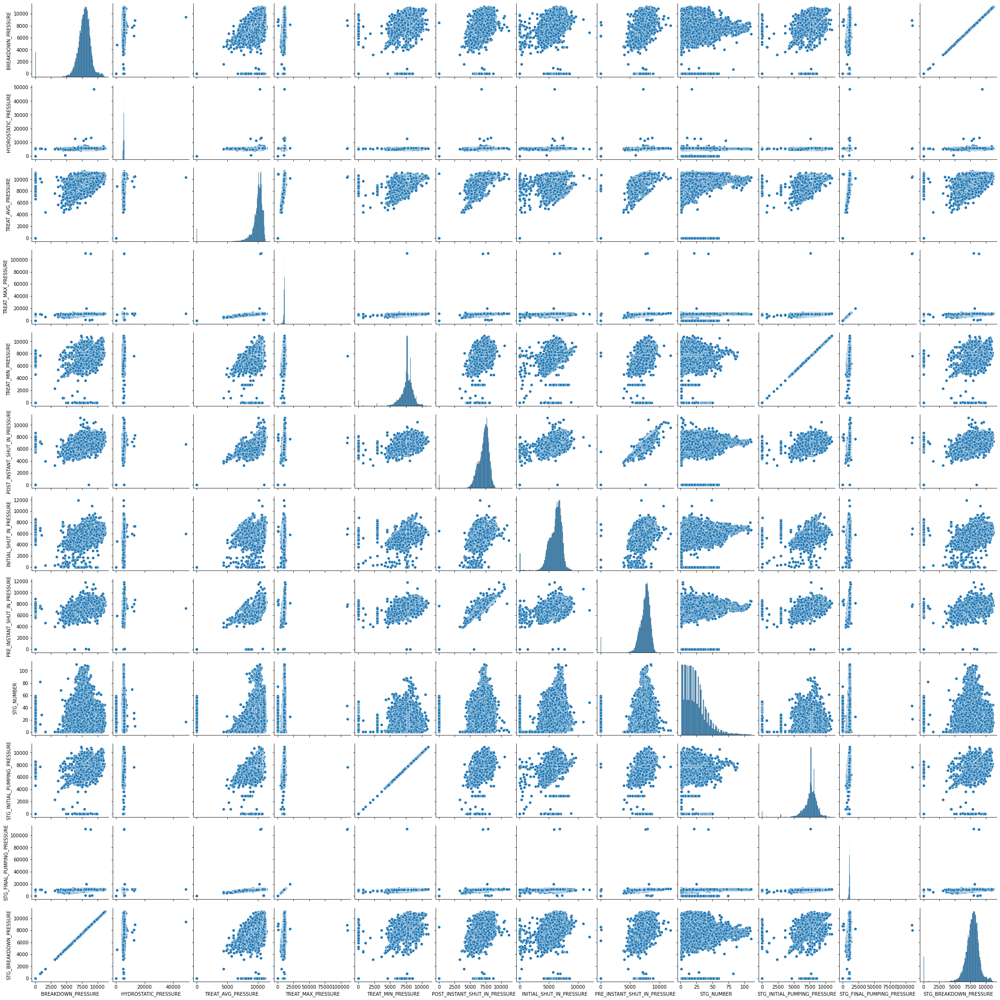

In [36]:
g = sns.pairplot(df1)

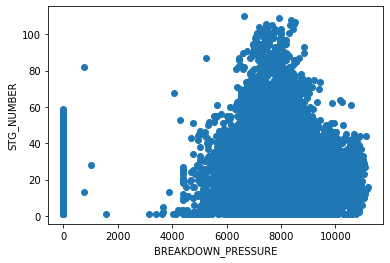

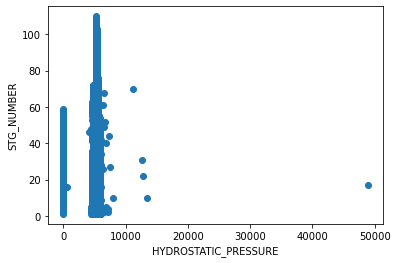

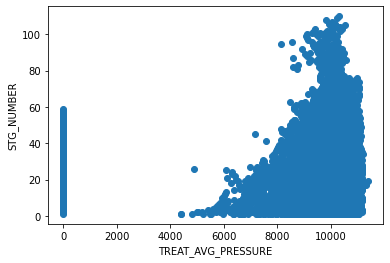

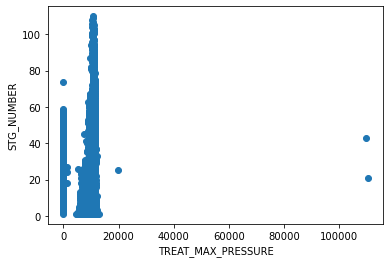

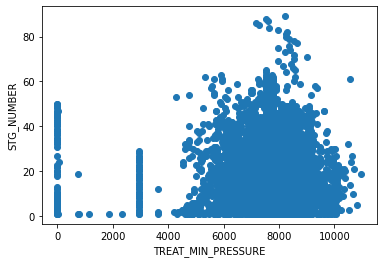

...

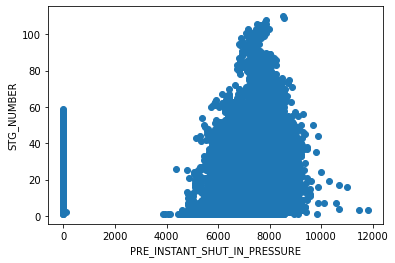

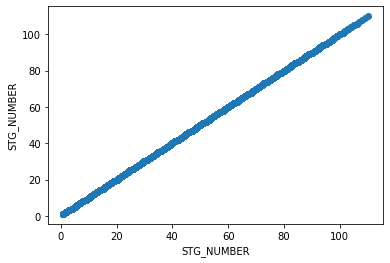

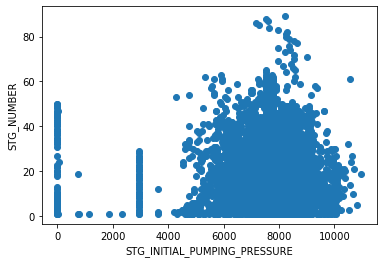

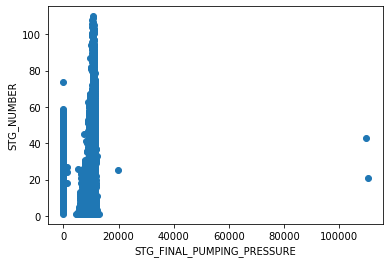

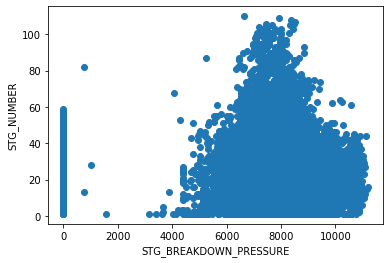

In [37]:
for feature in pressure_feature:

        data=df.copy()
    
        plt.scatter(data[feature],data['STG_NUMBER'])
        plt.xlabel(feature)
        plt.ylabel('STG_NUMBER')
        plt.show()

Discrete Features

In [38]:
discrete_feature=[feature for feature in numeric_features if len(df[feature].unique())>10 and feature not in pressure_feature+['Id'] and len(df[feature].unique())<1000 ]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 11


In [39]:
df[discrete_feature].describe()


,UWI,PROPPANT_DESIGNED,PROPPANT_IN_WELLBORE,MAX_PUMP_RATING,TREAT_AVG_RATE,TREAT_MAX_RATE,TREAT_MIN_RATE,PUMPSONLINENO,USERNUM1,USERNUM3,DURPUMP
count,1.772100e+04,1.771800e+04,1.045300e+04,14802.000000,17715.000000,17716.000000,17695.000000,9766.000000,9738.000000,9766.000000,7592.000000
mean,2.019001e+09,4.214046e+05,6.705146e+03,35402.915417,80.753373,86.566832,14.951964,17.077002,18.851715,16.328487,114.161617
std,3.305416e+02,1.245227e+05,5.352975e+04,6067.791669,171.284732,226.849020,84.706975,2.647784,2.815578,2.765863,43.088367
min,2.019000e+09,0.000000e+00,0.000000e+00,10370.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.019000e+09,4.200000e+05,0.000000e+00,32000.000000,71.000000,76.000000,10.000000,17.000000,18.000000,16.000000,96.000000
50%,2.019001e+09,4.200000e+05,0.000000e+00,34000.000000,80.000000,85.000000,10.000000,17.000000,19.000000,17.000000,120.000000
75%,2.019001e+09,5.200000e+05,0.000000e+00,40000.000000,88.000000,90.000000,14.000000,18.000000,20.000000,18.000000,134.000000
max,2.019001e+09,1.439750e+06,1.299320e+06,340000.000000,10630.000000,11191.000000,8472.000000,22.000000,26.000000,22.000000,616.000000


Discrete Features against UWI and STG_NUMBER
Not really any correlations

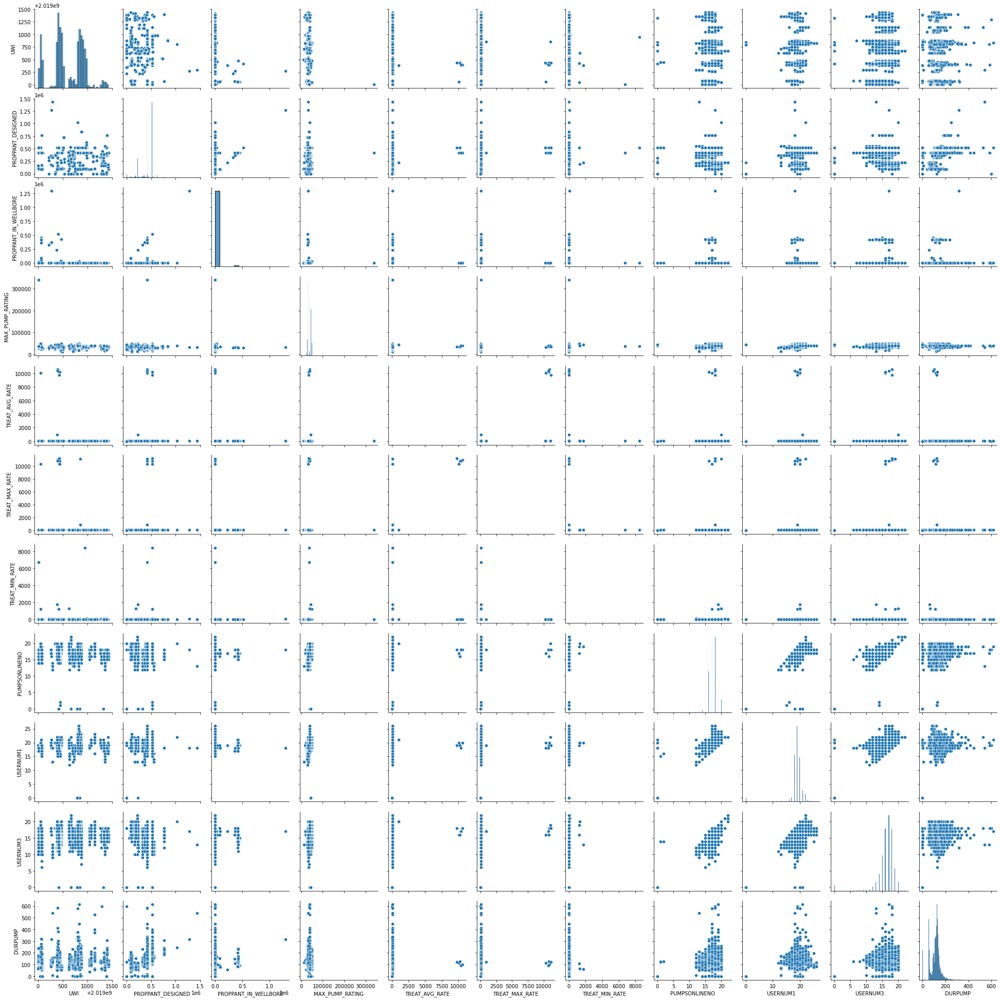

In [40]:
df1 = df[discrete_feature]
g = sns.pairplot(df1)

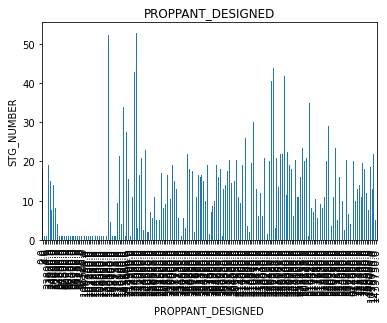

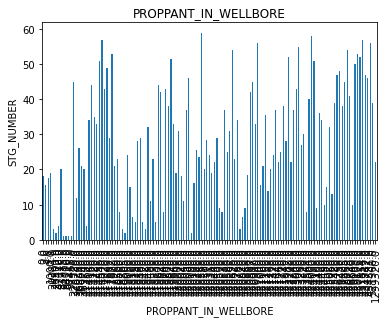

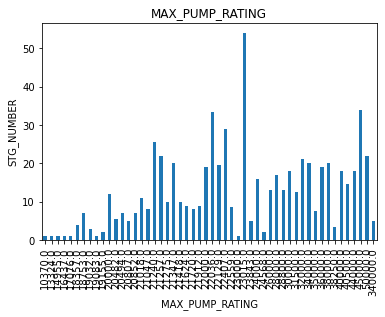

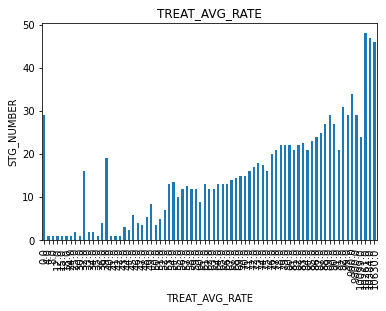

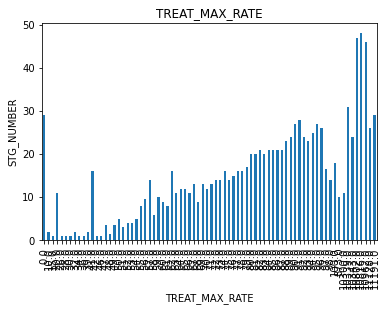

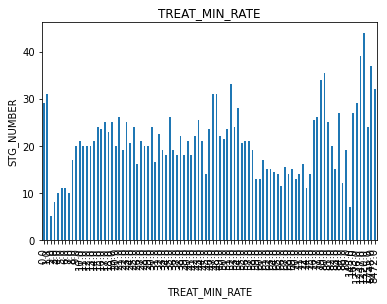

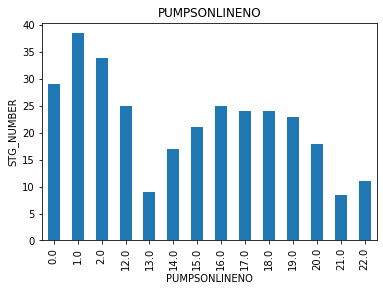

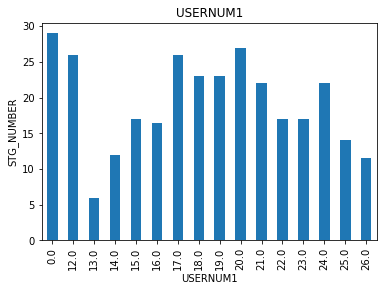

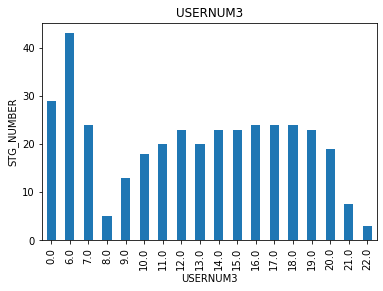

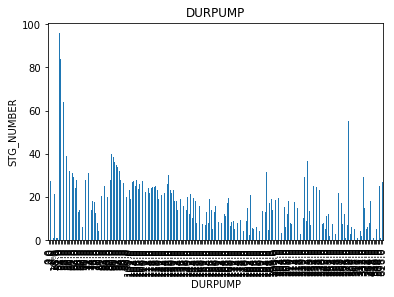

In [41]:
for feature in discrete_feature:
    if feature!='UWI' and 'STG_NUMBER':
        data=df.copy()
        data.groupby(feature)['STG_NUMBER'].median().plot.bar()
        plt.xlabel(feature)
        plt.ylabel('STG_NUMBER')
        plt.title(feature)
        plt.show()


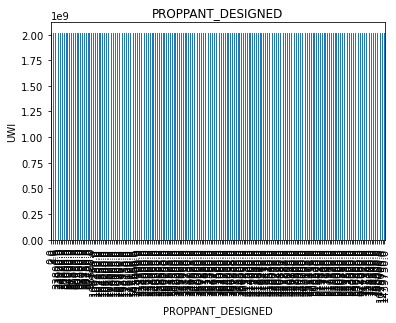

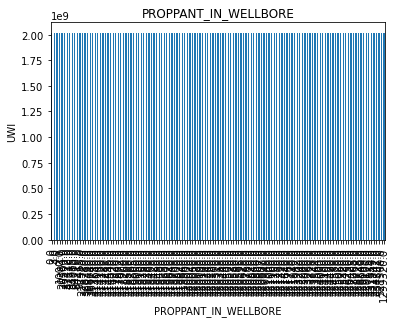

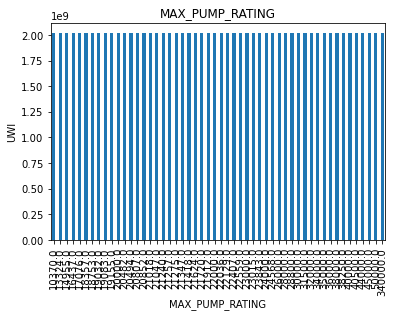

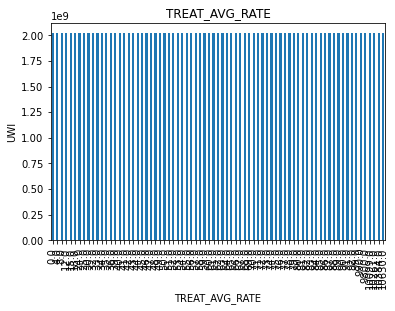

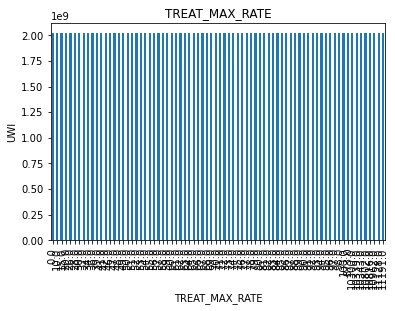

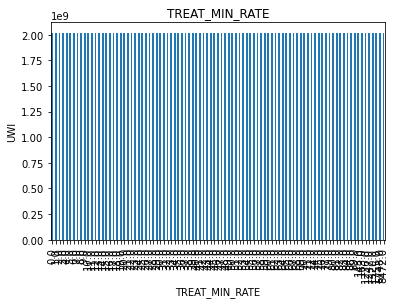

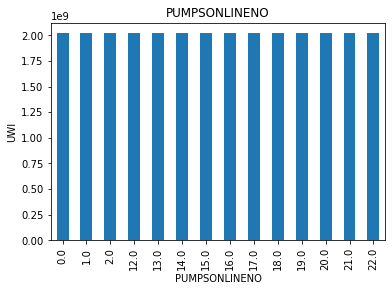

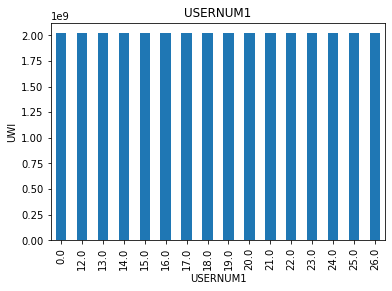

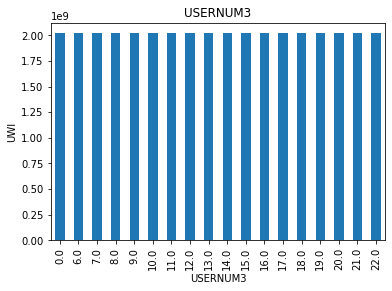

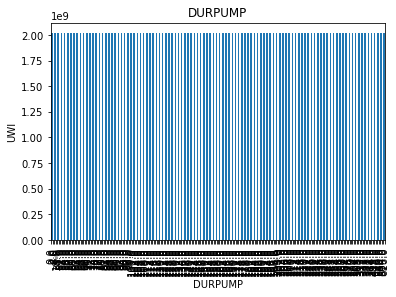

In [42]:
for feature in discrete_feature:
    if feature!='UWI' and 'STG_NUMBER':
        data=df.copy()
        data.groupby(feature)['UWI'].median().plot.bar()
        plt.xlabel(feature)
        plt.ylabel('UWI')
        plt.title(feature)
        plt.show()

In [43]:
continuous_feature=[feature for feature in numeric_features if feature not in discrete_feature+pressure_feature+['Id']]
print("Continuous Feature Count {}".format(len(continuous_feature)))

Continuous Feature Count 16


The Depths got a nice shape

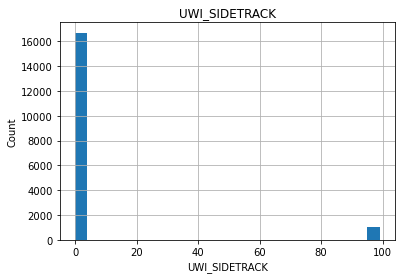

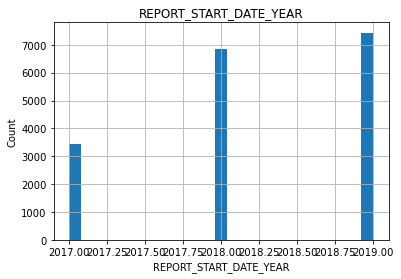

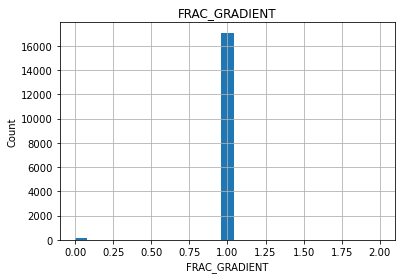

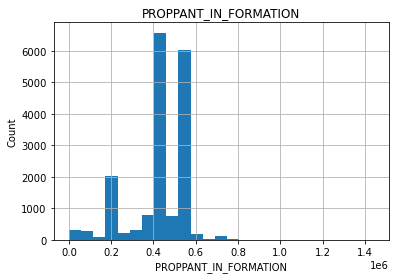

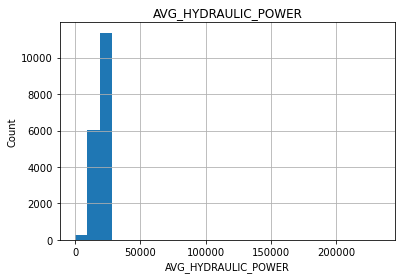

...

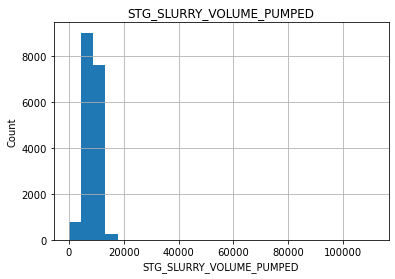

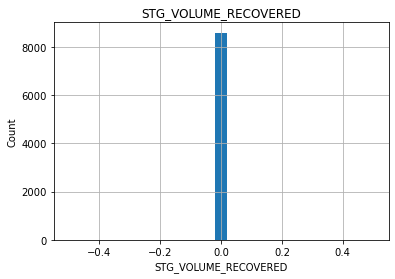

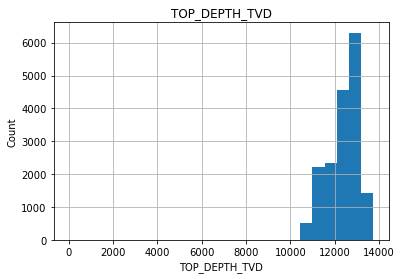

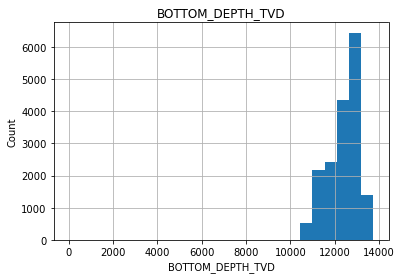

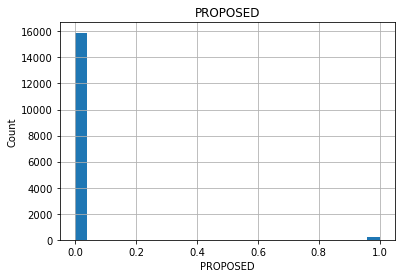

In [44]:
for feature in continuous_feature:
    data=df.copy()
    data[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

In [45]:
df2 = pd.read_excel(path + file_2)

In [46]:
df2.describe()

,UWI,UWI_SIDETRACK,REPORT_START_DATE_YEAR,FRAC_GRADIENT,BREAKDOWN_PRESSURE,HYDROSTATIC_PRESSURE,TREAT_AVG_PRESSURE,TREAT_MAX_PRESSURE,TREAT_MIN_PRESSURE,PROPPANT_DESIGNED,...,STG_CLEAN_VOLUME_PUMPED,STG_SLURRY_VOLUME_PUMPED,STG_VOLUME_RECOVERED,PUMPSONLINENO,USERNUM1,USERNUM3,DURPUMP,TOP_DEPTH_TVD,BOTTOM_DEPTH_TVD,PROPOSED
count,1.654000e+03,1654.000000,1654.000000,1261.000000,1351.000000,1611.000000,1652.000000,1652.000000,908.000000,1.653000e+03,...,1654.000000,1654.000000,1068.0,768.000000,740.000000,768.000000,513.000000,1634.000000,1654.000000,1499.000000
mean,2.019001e+09,0.030834,2018.119105,0.998414,6695.372317,5434.203600,8534.148910,8982.685835,6911.194934,3.127661e+05,...,7356.957074,7698.151149,0.0,16.511719,18.158108,15.869792,112.623782,12505.935129,12505.276904,0.006671
std,3.710343e+02,0.172921,0.796824,0.039809,1846.034959,324.889597,998.290004,986.262340,1467.860076,1.282900e+05,...,3310.723033,3368.878292,0.0,2.167044,1.698722,2.333638,49.387150,555.222512,564.089855,0.081431
min,2.019000e+09,0.000000,2017.000000,0.000000,0.000000,498.000000,4391.000000,4570.000000,0.000000,0.000000e+00,...,0.000000,0.000000,0.0,0.000000,12.000000,0.000000,0.000000,11094.000000,11123.000000,0.000000
25%,2.019001e+09,0.000000,2017.000000,1.000000,6167.500000,5287.000000,7957.000000,8462.000000,6462.750000,2.406250e+05,...,6097.750000,6335.000000,0.0,15.000000,18.000000,14.000000,89.000000,12242.000000,12130.000000,0.000000
50%,2.019001e+09,0.000000,2018.000000,1.000000,6944.000000,5483.000000,8615.500000,9113.000000,7346.000000,3.500000e+05,...,7153.500000,7543.500000,0.0,17.000000,18.000000,16.000000,117.000000,12580.000000,12696.500000,0.000000
75%,2.019001e+09,0.000000,2019.000000,1.000000,7698.500000,5594.000000,9278.750000,9684.500000,7659.000000,3.815000e+05,...,7906.750000,8326.500000,0.0,18.000000,19.000000,18.000000,132.000000,12874.500000,12892.000000,0.000000
max,2.019001e+09,1.000000,2019.000000,1.000000,10300.000000,12713.000000,10450.000000,10729.000000,9170.000000,1.439750e+06,...,45000.000000,45539.000000,0.0,22.000000,22.000000,22.000000,599.000000,13626.000000,13685.000000,1.000000


In [47]:
df2.shape

(1654, 76)

In [48]:
numeric_features = df2.select_dtypes(include=[np.number])
numeric_features.columns

Index(['UWI', 'UWI_SIDETRACK', 'REPORT_START_DATE_YEAR', 'FRAC_GRADIENT',
       'BREAKDOWN_PRESSURE', 'HYDROSTATIC_PRESSURE', 'TREAT_AVG_PRESSURE',
       'TREAT_MAX_PRESSURE', 'TREAT_MIN_PRESSURE', 'PROPPANT_DESIGNED',
       'PROPPANT_IN_FORMATION', 'PROPPANT_IN_WELLBORE', 'AVG_HYDRAULIC_POWER',
       'MAX_PUMP_POWER', 'MAX_PUMP_RATING', 'TREAT_AVG_RATE', 'TREAT_MAX_RATE',
       'TREAT_MIN_RATE', 'POST_INSTANT_SHUT_IN_PRESSURE',
       'INITIAL_SHUT_IN_PRESSURE', 'PRE_INSTANT_SHUT_IN_PRESSURE',
       'STG_NUMBER', 'STG_TOP_DEPTH', 'STG_BOTTOM_DEPTH',
       'STG_ELEMENT_TOP_DEPTH', 'STG_ELEMENT_BOTTOM_DEPTH',
       'STG_INITIAL_PUMPING_PRESSURE', 'STG_FINAL_PUMPING_PRESSURE',
       'STG_BREAKDOWN_PRESSURE', 'STG_CLEAN_VOLUME_PUMPED',
       'STG_SLURRY_VOLUME_PUMPED', 'STG_VOLUME_RECOVERED', 'PUMPSONLINENO',
       'USERNUM1', 'USERNUM3', 'DURPUMP', 'TOP_DEPTH_TVD', 'BOTTOM_DEPTH_TVD',
       'PROPOSED'],
      dtype='object')

In [49]:
numeric_features.head()


,UWI,UWI_SIDETRACK,REPORT_START_DATE_YEAR,FRAC_GRADIENT,BREAKDOWN_PRESSURE,HYDROSTATIC_PRESSURE,TREAT_AVG_PRESSURE,TREAT_MAX_PRESSURE,TREAT_MIN_PRESSURE,PROPPANT_DESIGNED,...,STG_CLEAN_VOLUME_PUMPED,STG_SLURRY_VOLUME_PUMPED,STG_VOLUME_RECOVERED,PUMPSONLINENO,USERNUM1,USERNUM3,DURPUMP,TOP_DEPTH_TVD,BOTTOM_DEPTH_TVD,PROPOSED
0,2019000699,0,2019,1.0,6740.0,5576.0,9358.0,9765.0,7346.0,152125.0,...,4466,4632,NaN,16.0,18.0,13.0,120.0,12872.0,12876,0.0
1,2019000665,0,2018,1.0,5100.0,5724.0,7280.0,9347.0,5100.0,0.0,...,24452,24452,0.0,NaN,NaN,NaN,NaN,12991.0,13064,0.0
2,2019000347,0,2017,1.0,4901.0,5087.0,4999.0,5384.0,NaN,0.0,...,5043,5043,0.0,NaN,NaN,NaN,NaN,11793.0,11646,0.0
3,2019001412,0,2019,1.0,5304.0,5623.0,9496.0,9602.0,NaN,130000.0,...,2923,3015,NaN,18.0,19.0,18.0,NaN,12985.0,12988,0.0
4,2019001390,0,2019,1.0,7340.0,5494.0,9523.0,9916.0,NaN,366938.0,...,7337,7677,NaN,17.0,18.0,16.0,0.0,12685.0,12676,0.0


In [50]:
pressure_feature = [feature for feature in numeric_features if 'PRESSURE' in feature]
pressure_feature

['BREAKDOWN_PRESSURE',
 'HYDROSTATIC_PRESSURE',
 'TREAT_AVG_PRESSURE',
 'TREAT_MAX_PRESSURE',
 'TREAT_MIN_PRESSURE',
 'POST_INSTANT_SHUT_IN_PRESSURE',
 'INITIAL_SHUT_IN_PRESSURE',
 'PRE_INSTANT_SHUT_IN_PRESSURE',
 'STG_INITIAL_PUMPING_PRESSURE',
 'STG_FINAL_PUMPING_PRESSURE',
 'STG_BREAKDOWN_PRESSURE']

In [51]:
other_features = [feature for feature in numeric_features if not feature in pressure_feature]
other_features

['UWI',
 'UWI_SIDETRACK',
 'REPORT_START_DATE_YEAR',
 'FRAC_GRADIENT',
 'PROPPANT_DESIGNED',
 'PROPPANT_IN_FORMATION',
 'PROPPANT_IN_WELLBORE',
 'AVG_HYDRAULIC_POWER',
 'MAX_PUMP_POWER',
 'MAX_PUMP_RATING',
 'TREAT_AVG_RATE',
 'TREAT_MAX_RATE',
 'TREAT_MIN_RATE',
 'STG_NUMBER',
 'STG_TOP_DEPTH',
 'STG_BOTTOM_DEPTH',
 'STG_ELEMENT_TOP_DEPTH',
 'STG_ELEMENT_BOTTOM_DEPTH',
 'STG_CLEAN_VOLUME_PUMPED',
 'STG_SLURRY_VOLUME_PUMPED',
 'STG_VOLUME_RECOVERED',
 'PUMPSONLINENO',
 'USERNUM1',
 'USERNUM3',
 'DURPUMP',
 'TOP_DEPTH_TVD',
 'BOTTOM_DEPTH_TVD',
 'PROPOSED']

In [52]:
# Removing non important quantitative
to_remove = [
    'UWI',
    'UWI_SIDETRACK',
    'STG_NUMBER',
    'PUMPSONLINENO',
    'USERNUM1',
    'USERNUM3',
    'PROPOSED'
]

for feature in to_remove:
    other_features.remove(feature)
        

In [53]:
other_features

['REPORT_START_DATE_YEAR',
 'FRAC_GRADIENT',
 'PROPPANT_DESIGNED',
 'PROPPANT_IN_FORMATION',
 'PROPPANT_IN_WELLBORE',
 'AVG_HYDRAULIC_POWER',
 'MAX_PUMP_POWER',
 'MAX_PUMP_RATING',
 'TREAT_AVG_RATE',
 'TREAT_MAX_RATE',
 'TREAT_MIN_RATE',
 'STG_TOP_DEPTH',
 'STG_BOTTOM_DEPTH',
 'STG_ELEMENT_TOP_DEPTH',
 'STG_ELEMENT_BOTTOM_DEPTH',
 'STG_CLEAN_VOLUME_PUMPED',
 'STG_SLURRY_VOLUME_PUMPED',
 'STG_VOLUME_RECOVERED',
 'DURPUMP',
 'TOP_DEPTH_TVD',
 'BOTTOM_DEPTH_TVD']

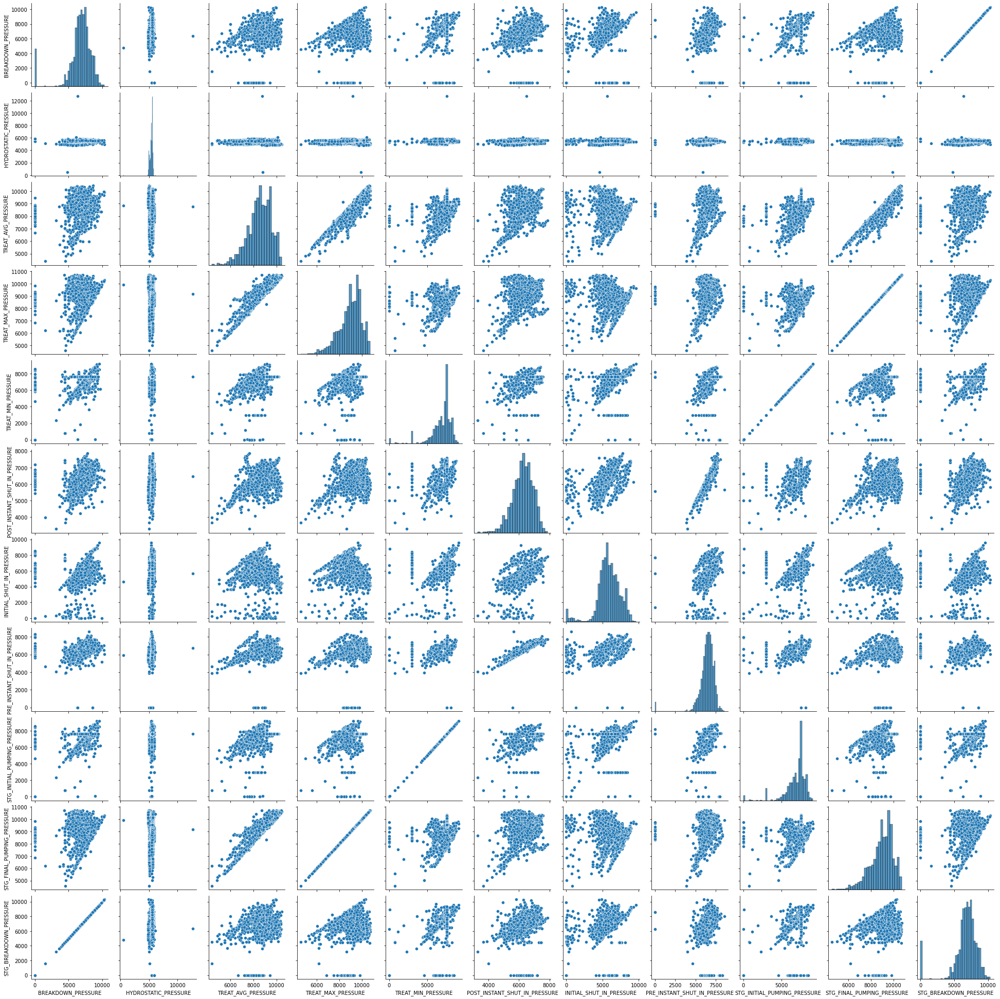

In [54]:
df1 = df2[pressure_feature]
g = sns.pairplot(df1)

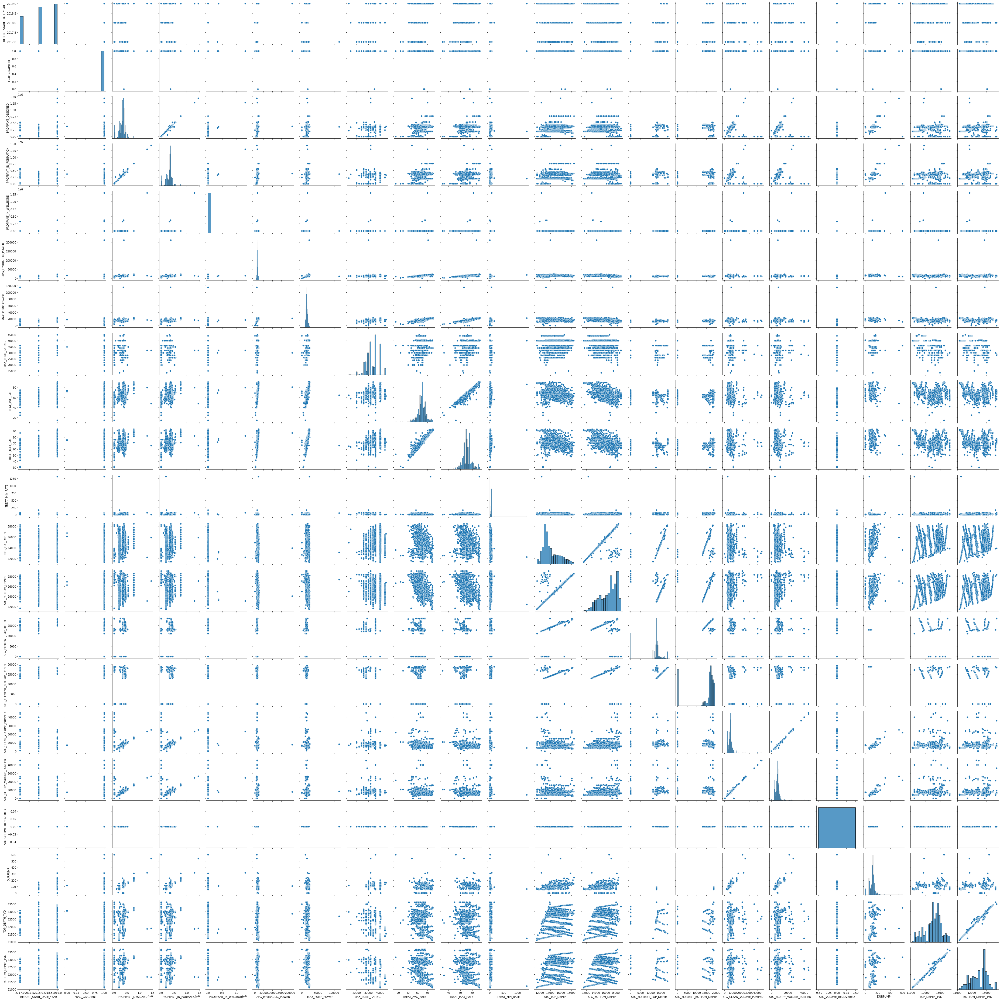

In [55]:
df1 = df2[other_features]
g = sns.pairplot(df1)

Not as nice as before, looked at the correlations for STG_CLEAN_VOLUME_PUMPED to see if any, just a lot of clumps. The STG_NUMBER is crappier and the UWI wasn't even worth keeping

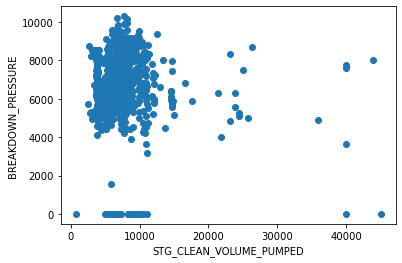

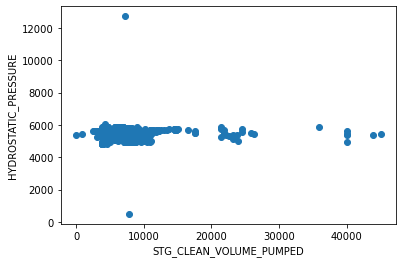

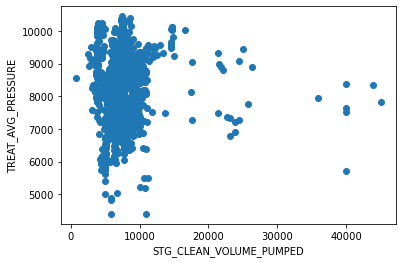

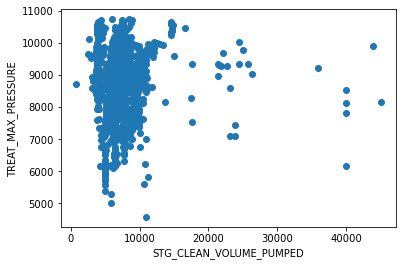

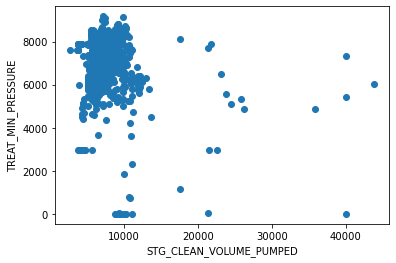

...

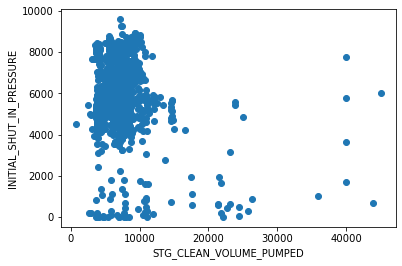

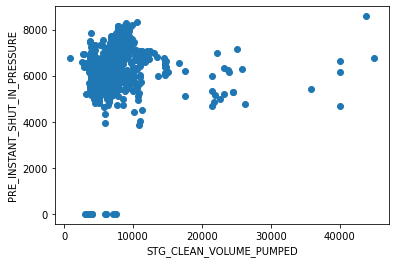

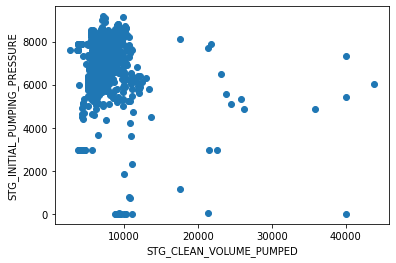

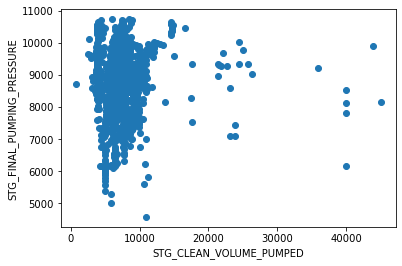

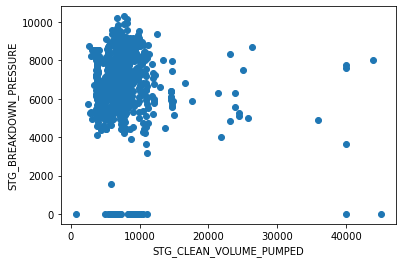

In [56]:
for feature in pressure_feature:

        data=df2.copy()
    
        plt.scatter(data['STG_CLEAN_VOLUME_PUMPED'],data[feature])
        plt.xlabel('STG_CLEAN_VOLUME_PUMPED')
        plt.ylabel(feature)
        plt.show()

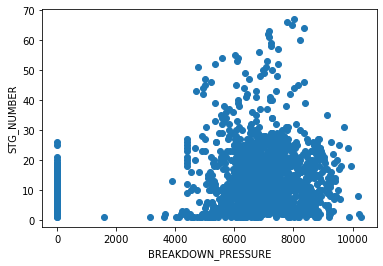

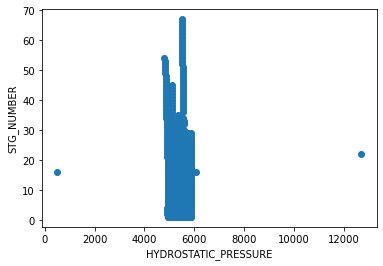

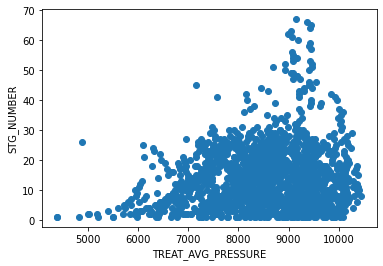

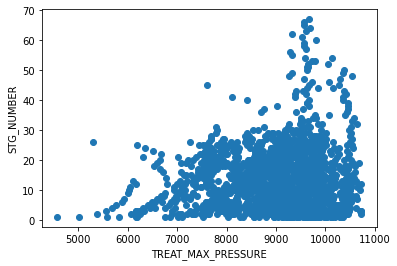

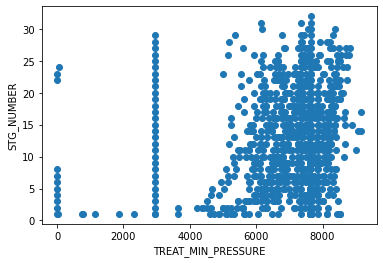

...

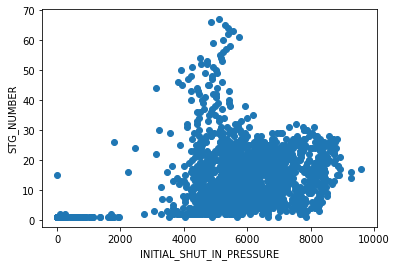

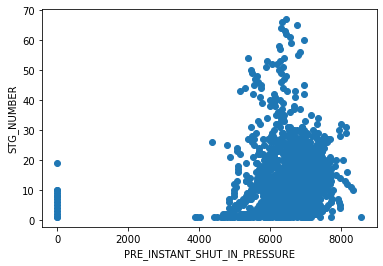

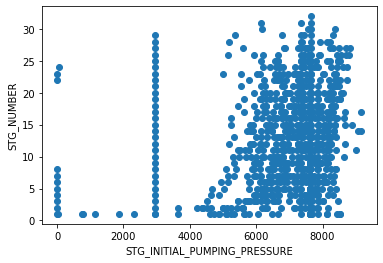

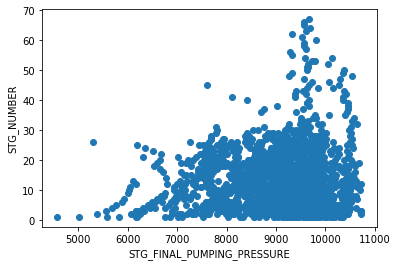

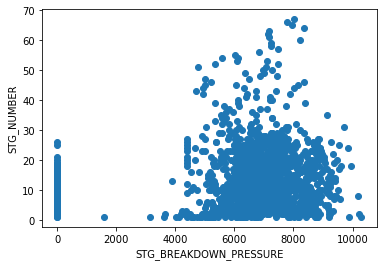

In [57]:
for feature in pressure_feature:

        data=df2.copy()
    
        plt.scatter(data[feature],data['STG_NUMBER'])
        plt.xlabel(feature)
        plt.ylabel('STG_NUMBER')
        plt.show()

In [58]:
discrete_feature=[feature for feature in numeric_features if len(df2[feature].unique())>10 and feature not in pressure_feature+['Id'] and len(df2[feature].unique())<1000 ]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 18


In [59]:
df2[discrete_feature].describe()


,UWI,PROPPANT_DESIGNED,PROPPANT_IN_FORMATION,MAX_PUMP_RATING,TREAT_AVG_RATE,TREAT_MAX_RATE,TREAT_MIN_RATE,STG_NUMBER,STG_TOP_DEPTH,STG_BOTTOM_DEPTH,STG_ELEMENT_TOP_DEPTH,STG_ELEMENT_BOTTOM_DEPTH,PUMPSONLINENO,USERNUM1,USERNUM3,DURPUMP,TOP_DEPTH_TVD,BOTTOM_DEPTH_TVD
count,1.654000e+03,1.653000e+03,1.654000e+03,1394.000000,1652.000000,1652.000000,1644.000000,1654.000000,1654.000000,1654.00000,539.000000,539.000000,768.000000,740.000000,768.000000,513.000000,1634.000000,1654.000000
mean,2.019001e+09,3.127661e+05,3.136721e+05,33560.817073,68.283898,71.191889,33.565085,14.706771,14021.561064,16515.87243,11122.161410,14343.350649,16.511719,18.158108,15.869792,112.623782,12505.935129,12505.276904
std,3.710343e+02,1.282900e+05,1.284107e+05,5050.824387,8.315255,7.449575,40.563364,10.342670,1563.939122,1683.46572,5264.627444,6570.769681,2.167044,1.698722,2.333638,49.387150,555.222512,564.089855
min,2.019000e+09,0.000000e+00,0.000000e+00,13324.000000,15.000000,30.000000,1.000000,1.000000,11365.000000,11445.00000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,11094.000000,11123.000000
25%,2.019001e+09,2.406250e+05,2.446350e+05,30000.000000,64.000000,66.000000,12.000000,7.000000,12864.000000,15225.00000,12103.000000,15790.500000,15.000000,18.000000,14.000000,89.000000,12242.000000,12130.000000
50%,2.019001e+09,3.500000e+05,3.500000e+05,34000.000000,69.000000,71.000000,19.000000,13.000000,13491.000000,16912.00000,12864.000000,17104.000000,17.000000,18.000000,16.000000,117.000000,12580.000000,12696.500000
75%,2.019001e+09,3.815000e+05,3.813200e+05,36000.000000,74.000000,75.000000,64.000000,20.750000,15070.750000,17994.00000,13391.000000,18157.000000,18.000000,19.000000,18.000000,132.000000,12874.500000,12892.000000
max,2.019001e+09,1.439750e+06,1.439750e+06,45000.000000,91.000000,93.000000,1320.000000,67.000000,18456.000000,19039.00000,18390.000000,19319.000000,22.000000,22.000000,22.000000,599.000000,13626.000000,13685.000000


Void the discrete features, not too much to look at

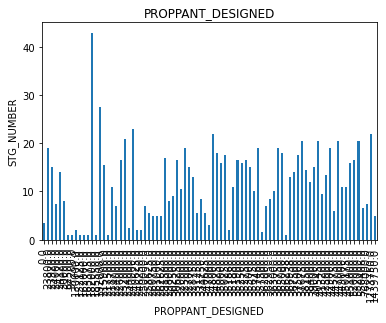

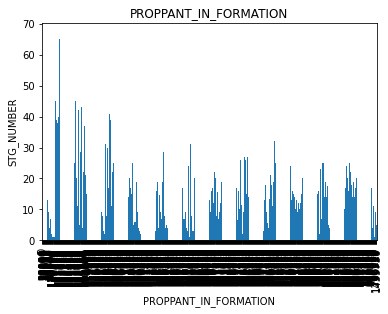

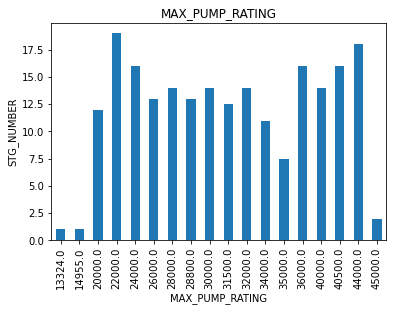

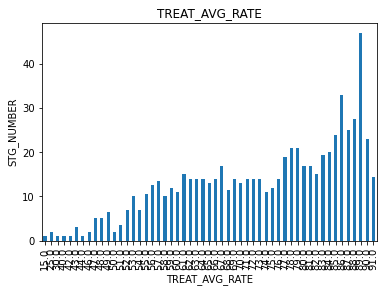

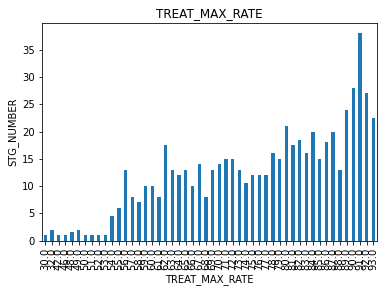

...

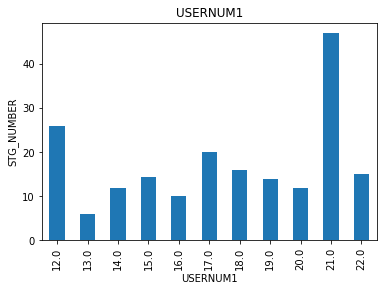

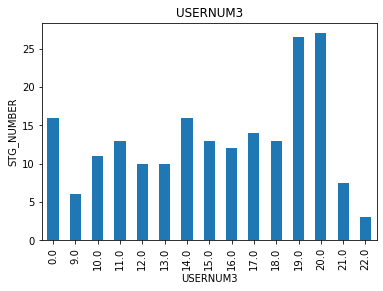

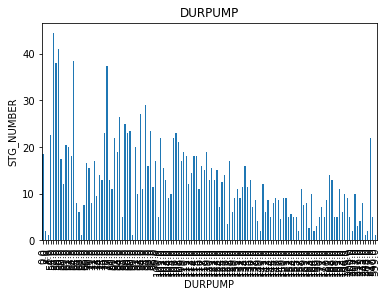

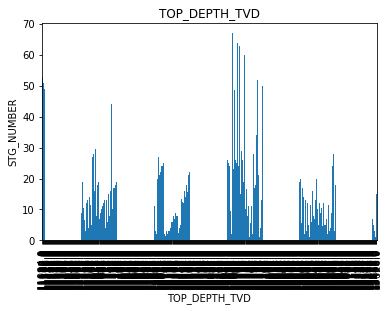

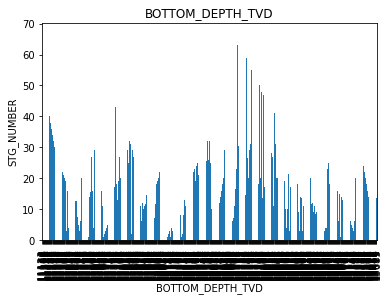

In [60]:
for feature in discrete_feature:
    if feature!='UWI' and 'STG_NUMBER':
        data=df2.copy()
        data.groupby(feature)['STG_NUMBER'].median().plot.bar()
        plt.xlabel(feature)
        plt.ylabel('STG_NUMBER')
        plt.title(feature)
        plt.show()

In [61]:
continuous_feature=[feature for feature in numeric_features if feature not in discrete_feature+pressure_feature+['Id']]
print("Continuous Feature Count {}".format(len(continuous_feature)))

Continuous Feature Count 10


Continious features are crap 

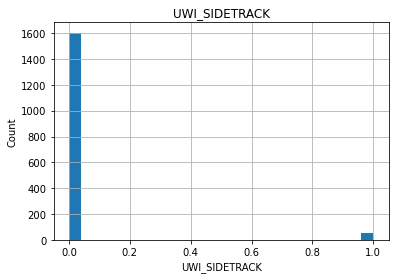

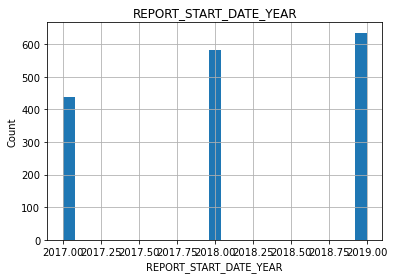

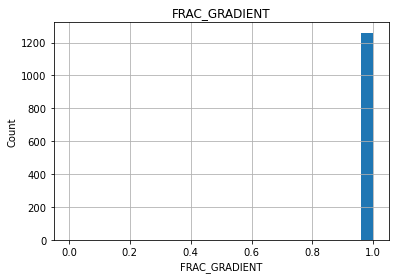

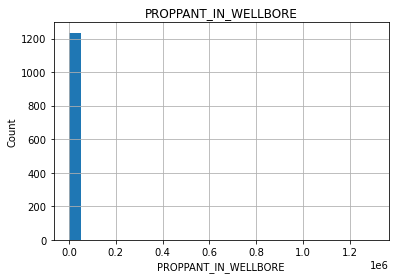

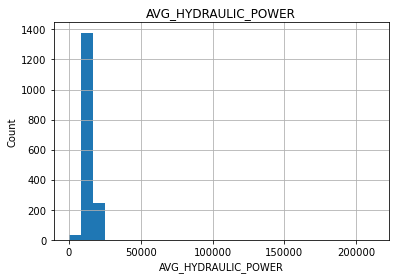

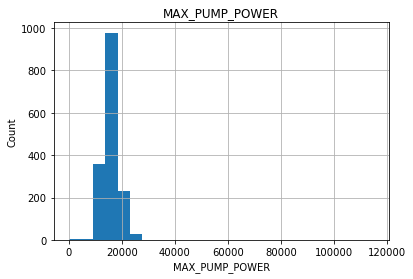

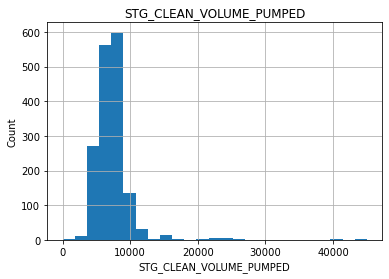

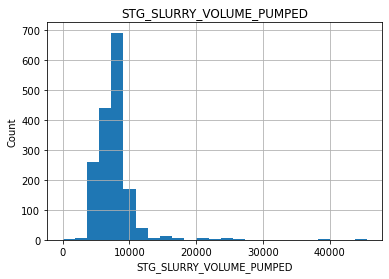

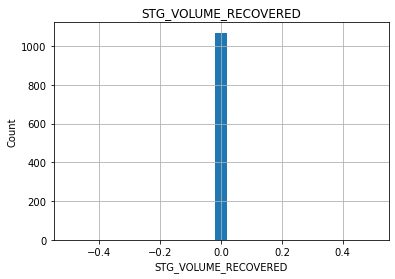

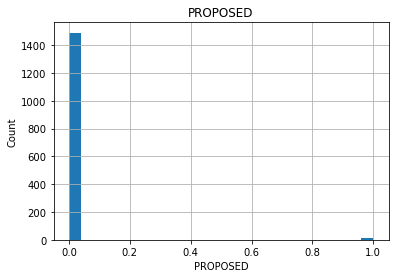

In [62]:
for feature in continuous_feature:
    data2=df.copy()
    data[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

In [63]:
df3 = pd.read_excel(path + file_3)

In [64]:
df3.describe()

,UWI,UWI_SIDETRACK,REPORT_START_DATE_YEAR,FRAC_GRADIENT,BREAKDOWN_PRESSURE,HYDROSTATIC_PRESSURE,TREAT_AVG_PRESSURE,TREAT_MAX_PRESSURE,TREAT_MIN_PRESSURE,PROPPANT_DESIGNED,...,STG_CLEAN_VOLUME_PUMPED,STG_SLURRY_VOLUME_PUMPED,STG_VOLUME_RECOVERED,PUMPSONLINENO,USERNUM1,USERNUM3,DURPUMP,TOP_DEPTH_TVD,BOTTOM_DEPTH_TVD,PROPOSED
count,1.772100e+04,17721.000000,17721.000000,17268.000000,17405.000000,17568.000000,17715.000000,17716.000000,7923.000000,1.771800e+04,...,17721.000000,17721.000000,8585.0,9766.000000,9738.000000,9766.000000,7592.000000,17341.000000,17359.000000,16086.000000
mean,2.019001e+09,5.869364,2018.224818,0.989808,7781.991612,5329.105134,9911.222241,10426.378189,7628.501956,4.214046e+05,...,8068.473167,8547.293832,0.0,17.077002,18.851715,16.328487,114.161617,12392.190531,12392.720260,0.011998
std,3.305416e+02,23.244326,0.750407,0.101590,1359.294791,694.369793,1231.553733,1639.148970,1135.258821,1.245227e+05,...,2510.731075,2796.264445,0.0,2.647784,2.815578,2.765863,43.088367,686.405510,694.576668,0.108880
min,2.019000e+09,0.000000,2017.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,5.000000,5.000000,0.000000
25%,2.019000e+09,0.000000,2018.000000,1.000000,7291.000000,5180.000000,9686.000000,10252.000000,7302.000000,4.200000e+05,...,6939.000000,7397.000000,0.0,17.000000,18.000000,16.000000,96.000000,11959.000000,11957.000000,0.000000
50%,2.019001e+09,0.000000,2018.000000,1.000000,7925.000000,5439.000000,10143.000000,10688.000000,7780.000000,4.200000e+05,...,7821.000000,8283.000000,0.0,17.000000,19.000000,17.000000,120.000000,12540.000000,12546.000000,0.000000
75%,2.019001e+09,0.000000,2019.000000,1.000000,8480.000000,5595.000000,10495.000000,10971.000000,8190.000000,5.200000e+05,...,10073.000000,10647.000000,0.0,18.000000,20.000000,18.000000,134.000000,12901.000000,12905.500000,0.000000
max,2.019001e+09,99.000000,2019.000000,2.000000,11190.000000,48884.000000,11394.000000,110445.000000,10972.000000,1.439750e+06,...,45000.000000,111000.000000,0.0,22.000000,26.000000,22.000000,616.000000,13741.000000,13744.000000,1.000000


In [65]:
df3.shape

(17721, 74)

In [66]:
numeric_features = df3.select_dtypes(include=[np.number])
numeric_features.columns

Index(['UWI', 'UWI_SIDETRACK', 'REPORT_START_DATE_YEAR', 'FRAC_GRADIENT',
       'BREAKDOWN_PRESSURE', 'HYDROSTATIC_PRESSURE', 'TREAT_AVG_PRESSURE',
       'TREAT_MAX_PRESSURE', 'TREAT_MIN_PRESSURE', 'PROPPANT_DESIGNED',
       'PROPPANT_IN_FORMATION', 'PROPPANT_IN_WELLBORE', 'AVG_HYDRAULIC_POWER',
       'MAX_PUMP_POWER', 'MAX_PUMP_RATING', 'TREAT_AVG_RATE', 'TREAT_MAX_RATE',
       'TREAT_MIN_RATE', 'POST_INSTANT_SHUT_IN_PRESSURE',
       'INITIAL_SHUT_IN_PRESSURE', 'PRE_INSTANT_SHUT_IN_PRESSURE',
       'STG_NUMBER', 'STG_TOP_DEPTH', 'STG_BOTTOM_DEPTH',
       'STG_ELEMENT_TOP_DEPTH', 'STG_ELEMENT_BOTTOM_DEPTH',
       'STG_INITIAL_PUMPING_PRESSURE', 'STG_FINAL_PUMPING_PRESSURE',
       'STG_BREAKDOWN_PRESSURE', 'STG_CLEAN_VOLUME_PUMPED',
       'STG_SLURRY_VOLUME_PUMPED', 'STG_VOLUME_RECOVERED', 'PUMPSONLINENO',
       'USERNUM1', 'USERNUM3', 'DURPUMP', 'TOP_DEPTH_TVD', 'BOTTOM_DEPTH_TVD',
       'PROPOSED'],
      dtype='object')

In [67]:
numeric_features.head()


,UWI,UWI_SIDETRACK,REPORT_START_DATE_YEAR,FRAC_GRADIENT,BREAKDOWN_PRESSURE,HYDROSTATIC_PRESSURE,TREAT_AVG_PRESSURE,TREAT_MAX_PRESSURE,TREAT_MIN_PRESSURE,PROPPANT_DESIGNED,...,STG_CLEAN_VOLUME_PUMPED,STG_SLURRY_VOLUME_PUMPED,STG_VOLUME_RECOVERED,PUMPSONLINENO,USERNUM1,USERNUM3,DURPUMP,TOP_DEPTH_TVD,BOTTOM_DEPTH_TVD,PROPOSED
0,2019000507,0,2017,1.0,6547.0,4984.0,9919.0,10176.0,6550.0,104000.0,...,3014,3131,0.0,NaN,NaN,NaN,NaN,11508.0,11504.0,0.0
1,2019000477,0,2018,1.0,7348.0,5031.0,10027.0,10525.0,7348.0,104000.0,...,2692,2805,0.0,NaN,NaN,NaN,NaN,11598.0,11604.0,0.0
2,2019000699,0,2019,1.0,6740.0,5576.0,9358.0,9765.0,7346.0,152125.0,...,4466,4632,NaN,16.0,18.0,13.0,120.0,12872.0,12876.0,0.0
3,2019000665,0,2018,1.0,5100.0,5724.0,7280.0,9347.0,5100.0,0.0,...,24452,24452,0.0,NaN,NaN,NaN,NaN,12991.0,13064.0,0.0
4,2019000466,0,2017,1.0,6026.0,4696.0,8298.0,9349.0,6026.0,104000.0,...,3613,3768,0.0,NaN,NaN,NaN,NaN,10829.0,10826.0,0.0



Look at the first thing

In [68]:
pressure_feature = [feature for feature in numeric_features if 'PRESSURE' in feature]

pressure_feature

['BREAKDOWN_PRESSURE',
 'HYDROSTATIC_PRESSURE',
 'TREAT_AVG_PRESSURE',
 'TREAT_MAX_PRESSURE',
 'TREAT_MIN_PRESSURE',
 'POST_INSTANT_SHUT_IN_PRESSURE',
 'INITIAL_SHUT_IN_PRESSURE',
 'PRE_INSTANT_SHUT_IN_PRESSURE',
 'STG_INITIAL_PUMPING_PRESSURE',
 'STG_FINAL_PUMPING_PRESSURE',
 'STG_BREAKDOWN_PRESSURE']


Look at the first thing

In [69]:
other_features = [feature for feature in numeric_features if not feature in pressure_feature]
other_features

['UWI',
 'UWI_SIDETRACK',
 'REPORT_START_DATE_YEAR',
 'FRAC_GRADIENT',
 'PROPPANT_DESIGNED',
 'PROPPANT_IN_FORMATION',
 'PROPPANT_IN_WELLBORE',
 'AVG_HYDRAULIC_POWER',
 'MAX_PUMP_POWER',
 'MAX_PUMP_RATING',
 'TREAT_AVG_RATE',
 'TREAT_MAX_RATE',
 'TREAT_MIN_RATE',
 'STG_NUMBER',
 'STG_TOP_DEPTH',
 'STG_BOTTOM_DEPTH',
 'STG_ELEMENT_TOP_DEPTH',
 'STG_ELEMENT_BOTTOM_DEPTH',
 'STG_CLEAN_VOLUME_PUMPED',
 'STG_SLURRY_VOLUME_PUMPED',
 'STG_VOLUME_RECOVERED',
 'PUMPSONLINENO',
 'USERNUM1',
 'USERNUM3',
 'DURPUMP',
 'TOP_DEPTH_TVD',
 'BOTTOM_DEPTH_TVD',
 'PROPOSED']

In [70]:
# Removing non important quantitative
to_remove = [
    'UWI',
    'UWI_SIDETRACK',
    'STG_NUMBER',
    'PUMPSONLINENO',
    'USERNUM1',
    'USERNUM3',
    'PROPOSED'
]

for feature in to_remove:
    other_features.remove(feature)

other_features

['REPORT_START_DATE_YEAR',
 'FRAC_GRADIENT',
 'PROPPANT_DESIGNED',
 'PROPPANT_IN_FORMATION',
 'PROPPANT_IN_WELLBORE',
 'AVG_HYDRAULIC_POWER',
 'MAX_PUMP_POWER',
 'MAX_PUMP_RATING',
 'TREAT_AVG_RATE',
 'TREAT_MAX_RATE',
 'TREAT_MIN_RATE',
 'STG_TOP_DEPTH',
 'STG_BOTTOM_DEPTH',
 'STG_ELEMENT_TOP_DEPTH',
 'STG_ELEMENT_BOTTOM_DEPTH',
 'STG_CLEAN_VOLUME_PUMPED',
 'STG_SLURRY_VOLUME_PUMPED',
 'STG_VOLUME_RECOVERED',
 'DURPUMP',
 'TOP_DEPTH_TVD',
 'BOTTOM_DEPTH_TVD']

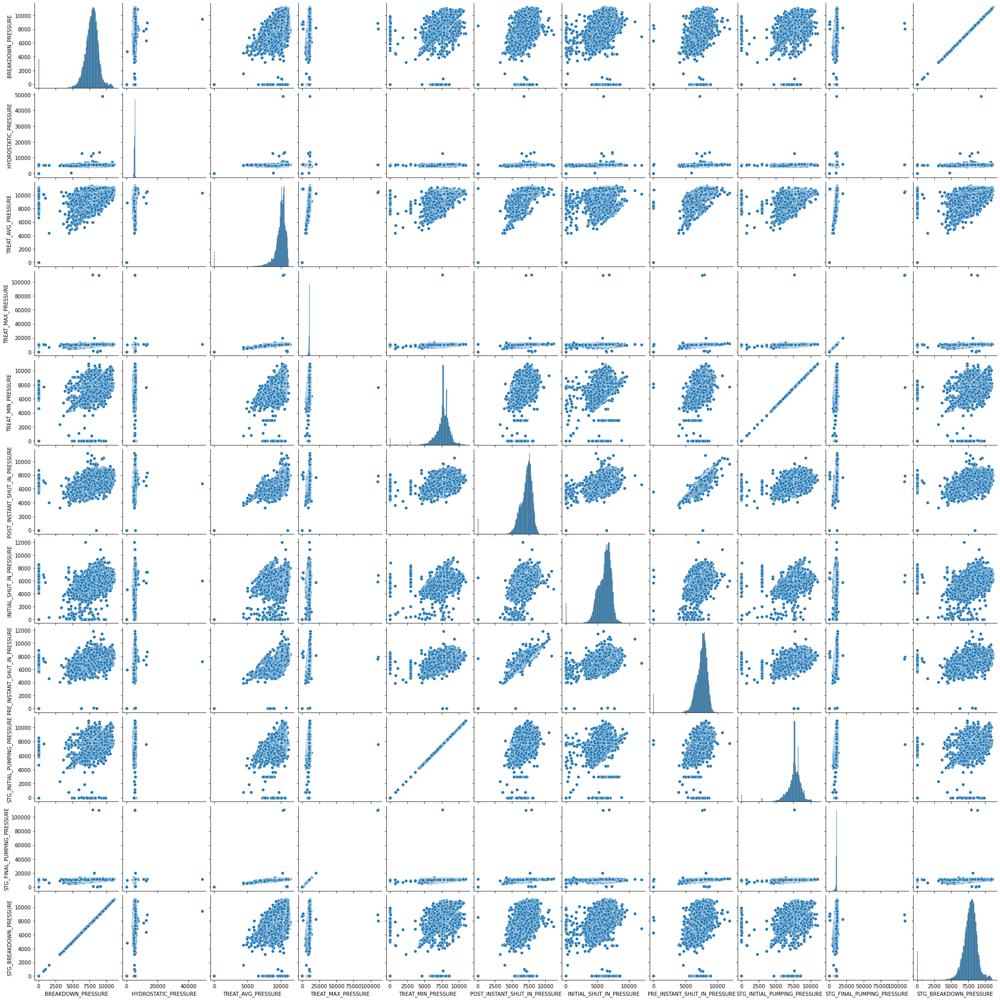

In [71]:
df1 = df3[pressure_feature]
g = sns.pairplot(df1)

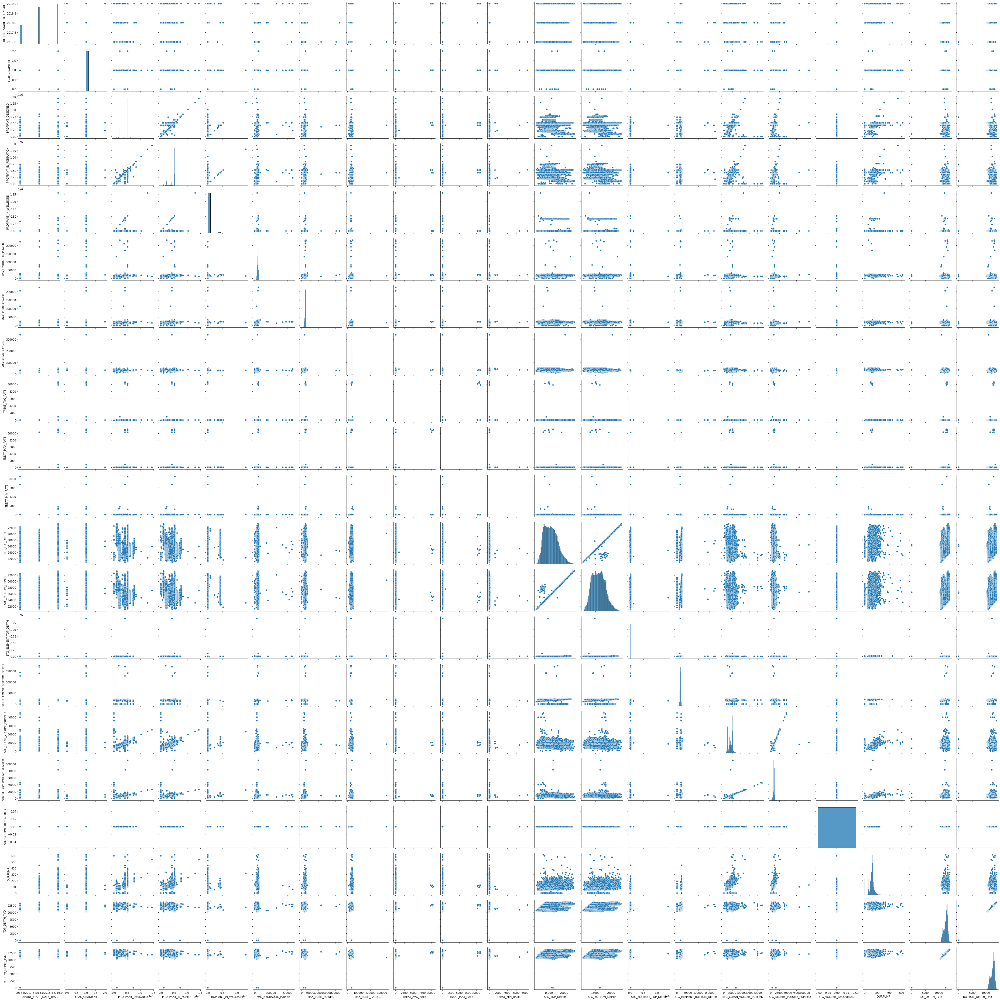

In [72]:
df1 = df3[other_features]
g = sns.pairplot(df1)

Pressure features. The stage number looks pretty good, some shapes happening.

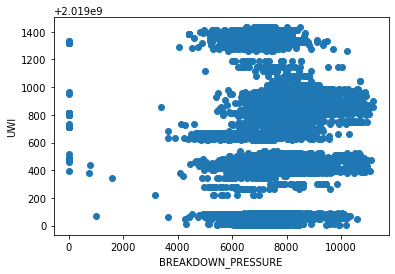

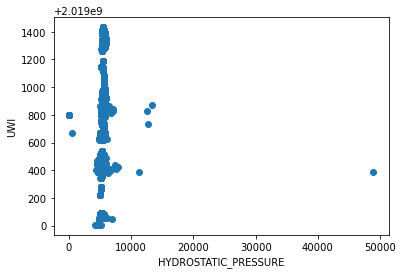

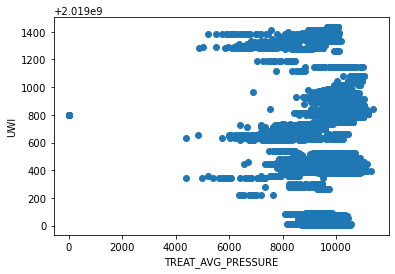

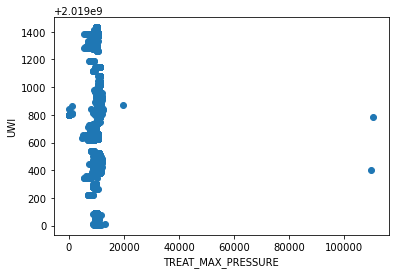

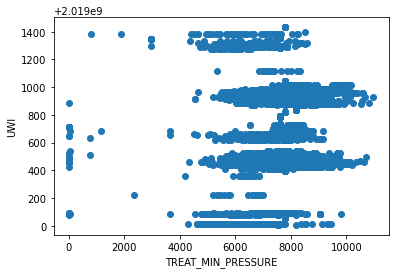

...

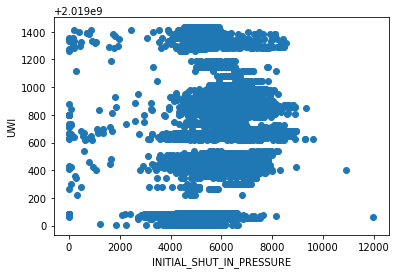

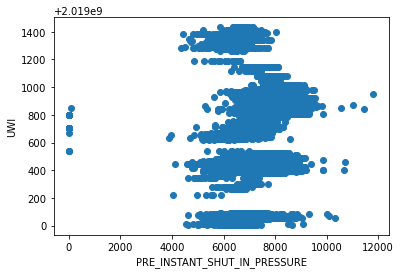

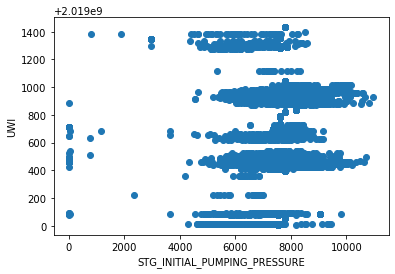

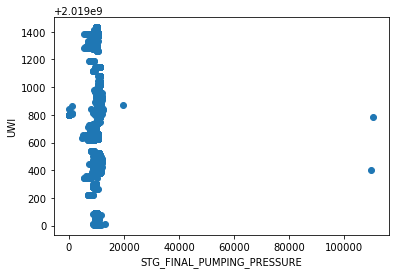

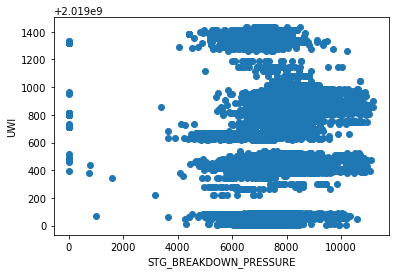

In [73]:
for feature in pressure_feature:

        data=df3.copy()
    
        plt.scatter(data[feature],data['UWI'])
        plt.xlabel(feature)
        plt.ylabel('UWI')
        plt.show()

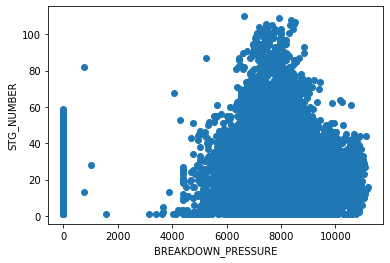

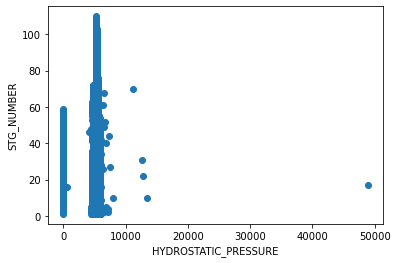

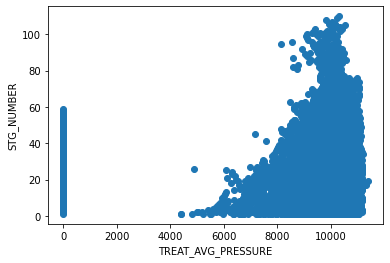

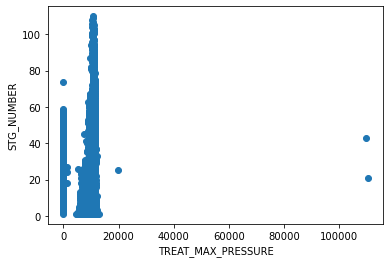

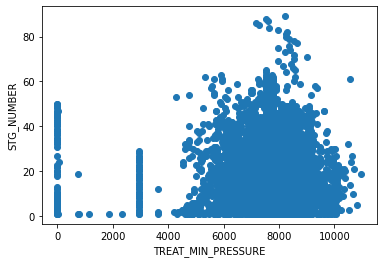

...

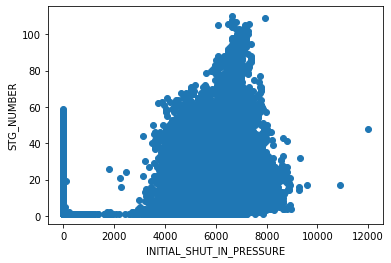

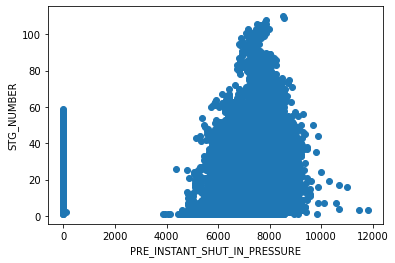

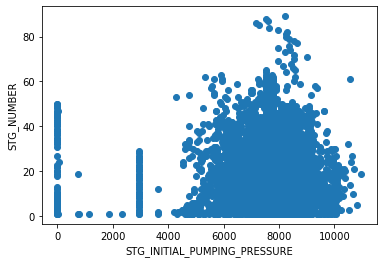

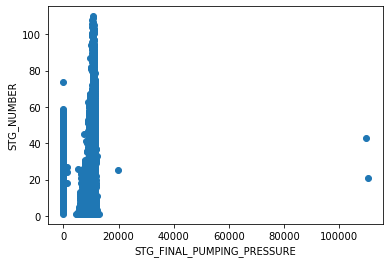

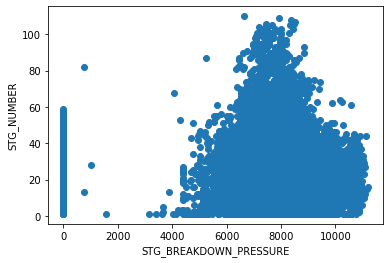

In [74]:
for feature in pressure_feature:

        data=df3.copy()
    
        plt.scatter(data[feature],data['STG_NUMBER'])
        plt.xlabel(feature)
        plt.ylabel('STG_NUMBER')
        plt.show()

In [75]:
discrete_feature=[feature for feature in numeric_features if len(df3[feature].unique())>10 and feature not in pressure_feature+['Id'] and len(df3[feature].unique())<1000 ]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 12


In [76]:
df3[discrete_feature].describe()

,UWI,PROPPANT_DESIGNED,PROPPANT_IN_WELLBORE,MAX_PUMP_RATING,TREAT_AVG_RATE,TREAT_MAX_RATE,TREAT_MIN_RATE,STG_NUMBER,PUMPSONLINENO,USERNUM1,USERNUM3,DURPUMP
count,1.772100e+04,1.771800e+04,1.045300e+04,14802.000000,17715.000000,17716.000000,17695.000000,17721.000000,9766.000000,9738.000000,9766.000000,7592.000000
mean,2.019001e+09,4.214046e+05,6.705146e+03,35402.915417,80.753373,86.566832,14.951964,22.951188,17.077002,18.851715,16.328487,114.161617
std,3.305416e+02,1.245227e+05,5.352975e+04,6067.791669,171.284732,226.849020,84.706975,16.784057,2.647784,2.815578,2.765863,43.088367
min,2.019000e+09,0.000000e+00,0.000000e+00,10370.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2.019000e+09,4.200000e+05,0.000000e+00,32000.000000,71.000000,76.000000,10.000000,10.000000,17.000000,18.000000,16.000000,96.000000
50%,2.019001e+09,4.200000e+05,0.000000e+00,34000.000000,80.000000,85.000000,10.000000,20.000000,17.000000,19.000000,17.000000,120.000000
75%,2.019001e+09,5.200000e+05,0.000000e+00,40000.000000,88.000000,90.000000,14.000000,31.000000,18.000000,20.000000,18.000000,134.000000
max,2.019001e+09,1.439750e+06,1.299320e+06,340000.000000,10630.000000,11191.000000,8472.000000,110.000000,22.000000,26.000000,22.000000,616.000000


Void the discrete stuff again

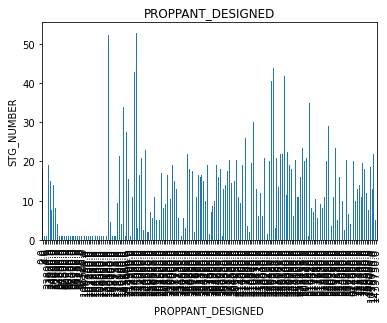

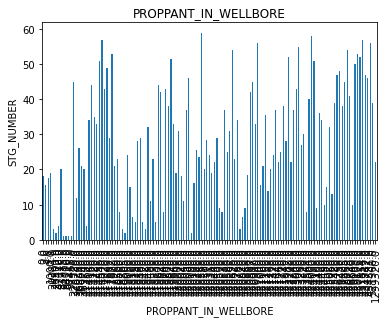

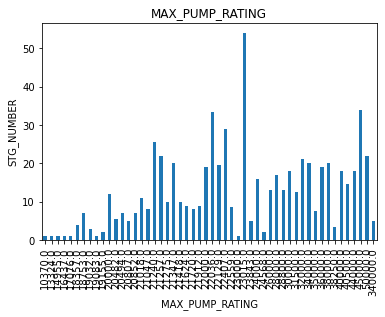

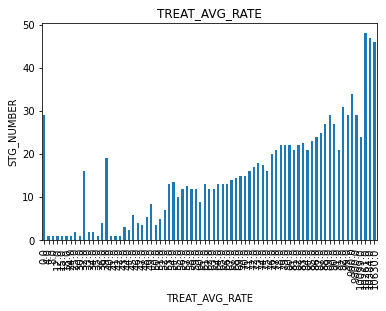

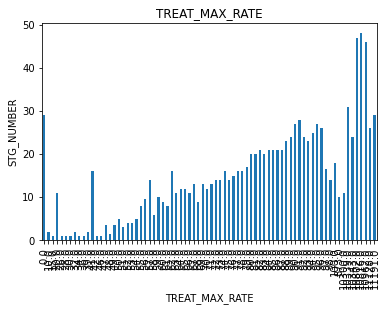

...

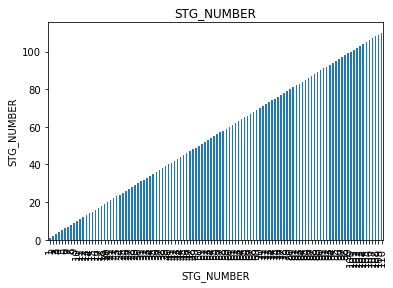

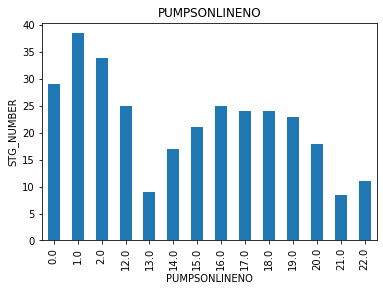

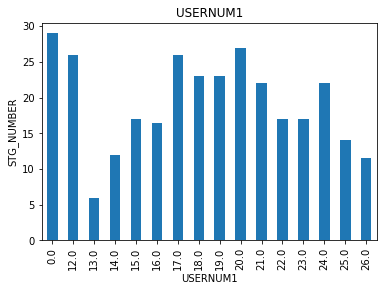

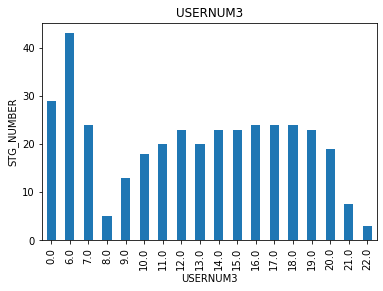

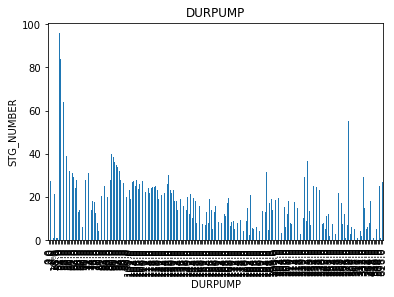

In [77]:
for feature in discrete_feature:
    if feature!='UWI' and 'STG_NUMBER':
        data=df3.copy()
        data.groupby(feature)['STG_NUMBER'].median().plot.bar()
        plt.xlabel(feature)
        plt.ylabel('STG_NUMBER')
        plt.title(feature)
        plt.show()

In [78]:
continuous_feature=[feature for feature in numeric_features if feature not in discrete_feature+pressure_feature+['Id']]
print("Continuous Feature Count {}".format(len(continuous_feature)))

Continuous Feature Count 16


Nothing important looking at the continious features

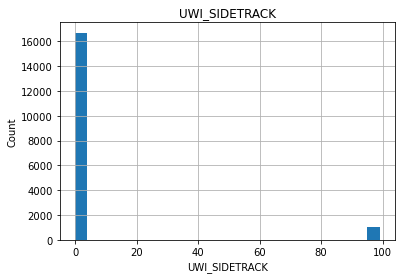

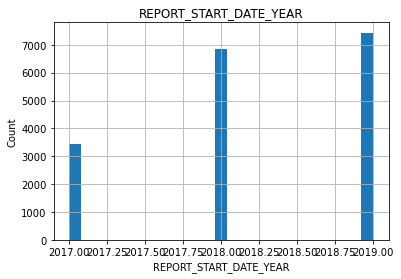

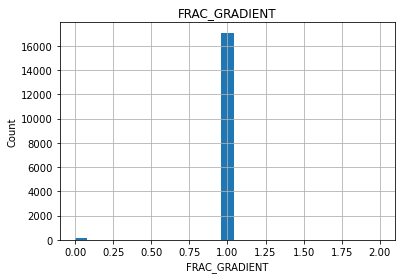

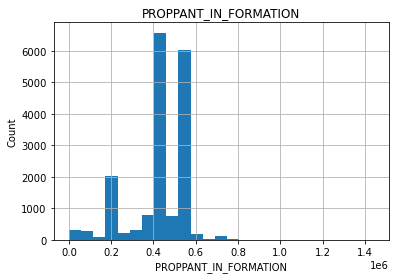

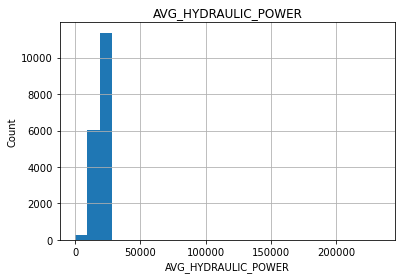

...

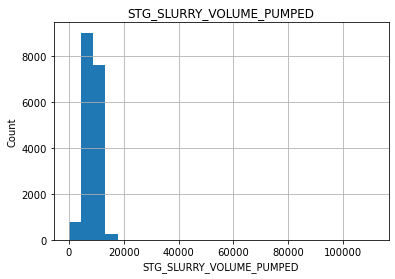

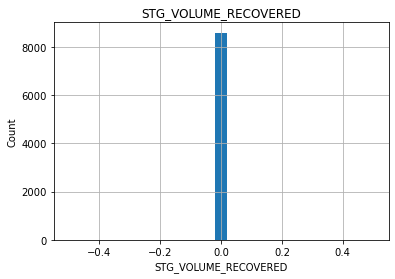

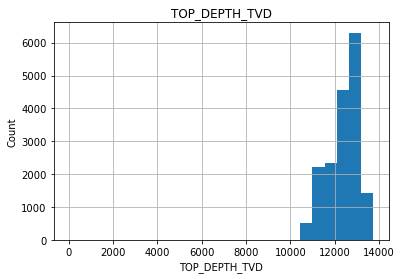

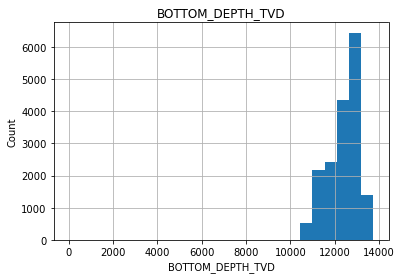

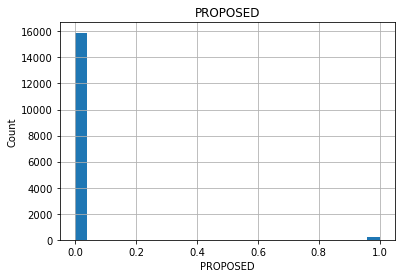

In [79]:
for feature in continuous_feature:
    data=df3.copy()
    data[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

In [80]:
df4 = pd.read_excel(path + file_4)

In [81]:
df4.describe()

,UWI,CYCLE_YEAR,CYCLE_MONTH,LEASE_OIL_PROD_VOL,LEASE_GAS_PROD_VOL,LEASE_GAS_LIFT_INJ_VOL,LEASE_COND_PROD_VOL
count,2.196800e+04,21968.000000,21968.000000,21968.000000,21968.000000,21968.0,21968.000000
mean,2.019001e+09,2018.702886,6.095776,12976.814776,16811.004188,0.0,3140.549299
std,3.107619e+02,0.663677,3.592849,35386.313029,38334.727040,0.0,8039.597968
min,2.019000e+09,2018.000000,1.000000,0.000000,0.000000,0.0,0.000000
25%,2.019001e+09,2018.000000,3.000000,0.000000,0.000000,0.0,0.000000
50%,2.019001e+09,2019.000000,6.000000,0.000000,0.000000,0.0,0.000000
75%,2.019001e+09,2019.000000,9.000000,4052.000000,9265.000000,0.0,1421.000000
max,2.019001e+09,2020.000000,12.000000,296746.000000,460522.000000,0.0,81668.000000


In [82]:
df4.shape

(21968, 8)

In [83]:
numeric_features = df4.select_dtypes(include=[np.number])
numeric_features.columns

Index(['UWI', 'CYCLE_YEAR', 'CYCLE_MONTH', 'LEASE_OIL_PROD_VOL',
       'LEASE_GAS_PROD_VOL', 'LEASE_GAS_LIFT_INJ_VOL', 'LEASE_COND_PROD_VOL'],
      dtype='object')

In [84]:
numeric_features.head()


,UWI,CYCLE_YEAR,CYCLE_MONTH,LEASE_OIL_PROD_VOL,LEASE_GAS_PROD_VOL,LEASE_GAS_LIFT_INJ_VOL,LEASE_COND_PROD_VOL
0,2019000005,2018,6,0,0,0,0
1,2019000005,2018,7,0,0,0,0
2,2019000005,2018,8,0,0,0,0
3,2019000005,2018,9,0,0,0,0
4,2019000005,2018,10,0,0,0,0


In [85]:
lease_feature = [feature for feature in numeric_features if 'LEASE' in feature  ]

lease_feature

['LEASE_OIL_PROD_VOL',
 'LEASE_GAS_PROD_VOL',
 'LEASE_GAS_LIFT_INJ_VOL',
 'LEASE_COND_PROD_VOL']

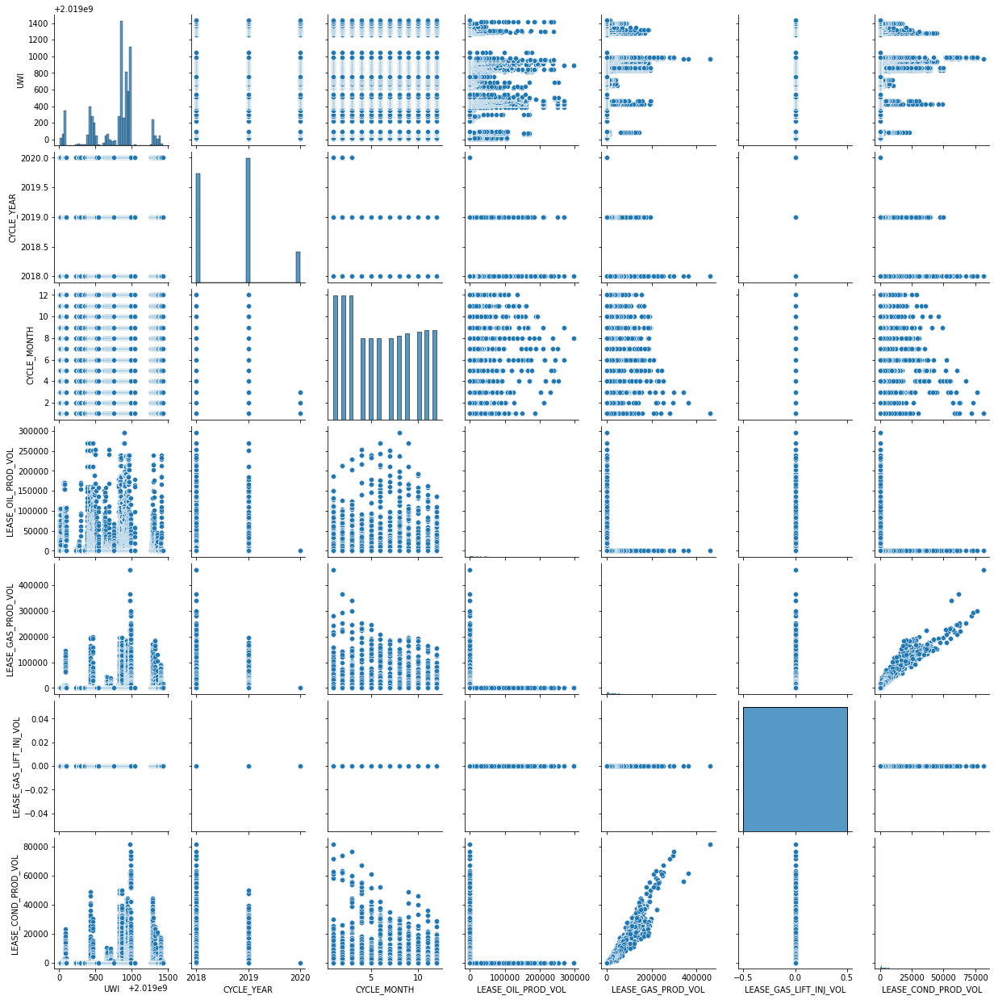

In [86]:
g = sns.pairplot(numeric_features)

Something is happening in the lease features. Not really nice tho

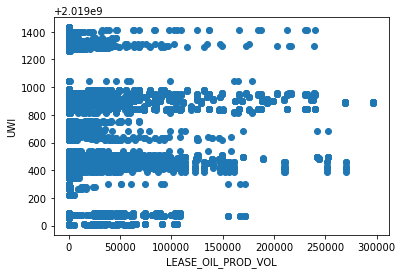

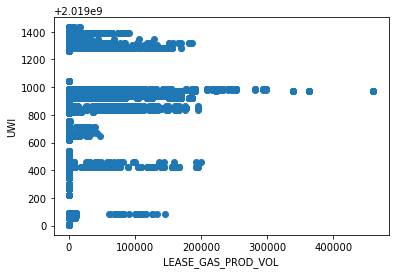

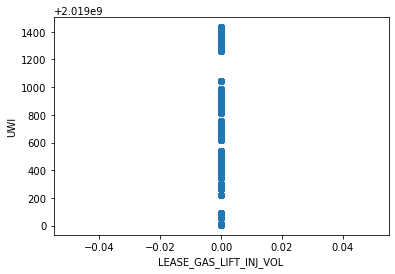

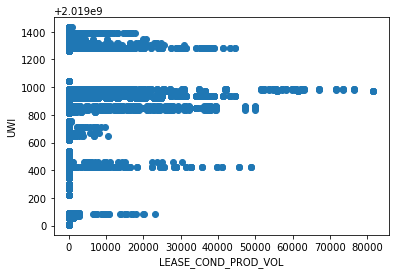

In [87]:
for feature in lease_feature:

        data=df4.copy()
    
        plt.scatter(data[feature],data['UWI'])
        plt.xlabel(feature)
        plt.ylabel('UWI')
        plt.show()

In [88]:
discrete_feature=[feature for feature in numeric_features if len(df4[feature].unique())>10 and feature not in lease_feature+['Id'] and len(df4[feature].unique())<1000 ]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 2


In [89]:
df4[discrete_feature].describe()


,UWI,CYCLE_MONTH
count,2.196800e+04,21968.000000
mean,2.019001e+09,6.095776
std,3.107619e+02,3.592849
min,2.019000e+09,1.000000
25%,2.019001e+09,3.000000
50%,2.019001e+09,6.000000
75%,2.019001e+09,9.000000
max,2.019001e+09,12.000000


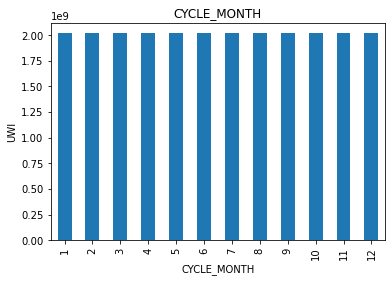

In [90]:
for feature in discrete_feature:
    if feature!='UWI' :
        data=df4.copy()
        data.groupby(feature)['UWI'].median().plot.bar()
        plt.xlabel(feature)
        plt.ylabel('UWI')
        plt.title(feature)
        plt.show()

In [91]:
continuous_feature=[feature for feature in numeric_features if feature not in discrete_feature+lease_feature+['Id']]
print("Continuous Feature Count {}".format(len(continuous_feature)))

Continuous Feature Count 1


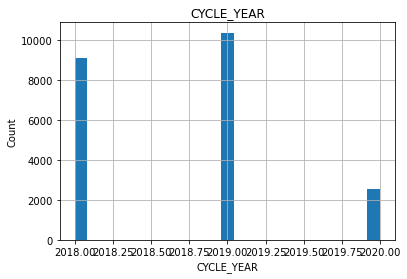

In [92]:
for feature in continuous_feature:
    data=df4.copy()
    data[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

In [93]:
df5 = pd.read_excel(path + file_5)

In [94]:
df5.describe()

,UWI,UWI_SIDETRACK,DAILY_OPS_START_DATE_YEAR,STIM_INT_FRAC_GRADIENT,BREAKDOWN_PRESS,STIM_INT_HYDROSTATIC_PRESS,STIM_INT_TREAT_AVG_PRESS,STIM_INT_TREAT_MAX_PRESS,STIM_INT_TREAT_MIN_PRESS,STIM_INT_PROPPANT_DESIGNED,...,STIM_INT_BREAKDOWN_PRESS,STIM_INT_AVG_RATE,STIM_INT_CLEAN_VOLUME_PUMPED,STIM_INT_SLURRY_VOLUME_PUMPED,STIM_INT_VOLUME_RECOVERED,STIM_INT_BOTTOM_DEPTH_TVD,STIM_INT_TOP_DEPTH_TVD,TOTAL_PUMPS_ON_LOCATION,PUMPS_ONLINE_AT_STG_START,PUMPS_ONLINE_AT_STG_END
count,2.742000e+03,2742.000000,2742.000000,2690.000000,2725.000000,2061.000000,2732.000000,2732.000000,1274.000000,2735.000000,...,2725.000000,2733.000000,2742.000000,2742.000000,2742.000000,2730.000000,2730.000000,1447.000000,1446.000000,1446.000000
mean,2.019110e+09,0.190372,2018.297593,1.026766,5522.426422,4032.087821,8201.148609,8979.787701,4440.056515,472651.136380,...,5522.426422,95.046103,9670.384026,10158.475565,3.982495,9073.157875,9069.232967,20.431237,19.661826,18.827801
std,2.100654e+01,0.502684,0.750815,1.506163,2309.334426,1025.598441,1576.828078,1563.381344,1169.125626,164456.661902,...,2309.334426,267.689690,3730.760539,3061.476701,208.539781,1448.071539,1449.710932,1.823261,1.722964,1.999675
min,2.019110e+09,0.000000,2017.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,4715.000000,4690.000000,15.000000,14.000000,10.000000
25%,2.019110e+09,0.000000,2018.000000,1.000000,4296.000000,4062.000000,7236.500000,8095.500000,3863.250000,440000.000000,...,4296.000000,80.000000,8448.500000,8918.500000,0.000000,9330.000000,9323.250000,20.000000,19.000000,18.000000
50%,2.019110e+09,0.000000,2018.000000,1.000000,4993.000000,4161.000000,8348.000000,9186.000000,4364.000000,550000.000000,...,4993.000000,86.000000,10612.500000,11219.500000,0.000000,9607.000000,9606.500000,20.000000,20.000000,19.000000
75%,2.019110e+09,0.000000,2019.000000,1.000000,6301.000000,4252.000000,9484.000000,10210.750000,4942.000000,550250.000000,...,6301.000000,91.000000,11105.250000,11737.000000,0.000000,9816.000000,9816.750000,22.000000,20.000000,20.000000
max,2.019110e+09,3.000000,2019.000000,79.000000,71111.000000,41089.000000,10995.000000,19557.000000,9240.000000,660260.000000,...,71111.000000,9288.000000,108445.000000,54658.000000,10920.000000,10701.000000,10701.000000,26.000000,24.000000,24.000000


In [95]:
df5.shape

(2742, 76)

In [96]:
numeric_features = df5.select_dtypes(include=[np.number])
numeric_features.columns

Index(['UWI', 'UWI_SIDETRACK', 'DAILY_OPS_START_DATE_YEAR',
       'STIM_INT_FRAC_GRADIENT', 'BREAKDOWN_PRESS',
       'STIM_INT_HYDROSTATIC_PRESS', 'STIM_INT_TREAT_AVG_PRESS',
       'STIM_INT_TREAT_MAX_PRESS', 'STIM_INT_TREAT_MIN_PRESS',
       'STIM_INT_PROPPANT_DESIGNED', 'STIM_INT_PROPPANT_TOTAL',
       'STIM_INT_PROPPANT_IN_WELLBORE', 'STIM_INT_AVG_HYDRAULIC_POWER',
       'STIM_INT_MAX_PUMP_POWER', 'STIM_INT_MAX_PUMP_RATING',
       'STIM_INT_TREAT_AVG_RATE', 'STIM_INT_TREAT_MAX_RATE',
       'STIM_INT_TREAT_MIN_RATE', 'STIM_INT_POST_INST_SHUT_IN_PRESS',
       'STIM_INT_INITIAL_SHUT_IN_PRESS', 'STIM_INT_STAGE_NUMBER',
       'STIM_INT_TOP_DEPTH', 'STIM_INT_BTM_DEPTH', 'ELEMENT_TOP_DEPTH',
       'ELEMENT_BOTTOM_DEPTH', 'STIM_INT_BREAKDOWN_PRESS', 'STIM_INT_AVG_RATE',
       'STIM_INT_CLEAN_VOLUME_PUMPED', 'STIM_INT_SLURRY_VOLUME_PUMPED',
       'STIM_INT_VOLUME_RECOVERED', 'STIM_INT_BOTTOM_DEPTH_TVD',
       'STIM_INT_TOP_DEPTH_TVD', 'TOTAL_PUMPS_ON_LOCATION',
       'PUMPS_ON

In [97]:
numeric_features.head()


,UWI,UWI_SIDETRACK,DAILY_OPS_START_DATE_YEAR,STIM_INT_FRAC_GRADIENT,BREAKDOWN_PRESS,STIM_INT_HYDROSTATIC_PRESS,STIM_INT_TREAT_AVG_PRESS,STIM_INT_TREAT_MAX_PRESS,STIM_INT_TREAT_MIN_PRESS,STIM_INT_PROPPANT_DESIGNED,...,STIM_INT_BREAKDOWN_PRESS,STIM_INT_AVG_RATE,STIM_INT_CLEAN_VOLUME_PUMPED,STIM_INT_SLURRY_VOLUME_PUMPED,STIM_INT_VOLUME_RECOVERED,STIM_INT_BOTTOM_DEPTH_TVD,STIM_INT_TOP_DEPTH_TVD,TOTAL_PUMPS_ON_LOCATION,PUMPS_ONLINE_AT_STG_START,PUMPS_ONLINE_AT_STG_END
0,2019110026,0,2017,1.0,4001.0,4066.0,4798.0,7663.0,3735.0,110000.0,...,4001.0,66.0,3899,4029,0,9375.0,9377.0,NaN,NaN,NaN
1,2019110016,0,2017,1.0,4076.0,2871.0,6922.0,7250.0,4076.0,150000.0,...,4076.0,74.0,4535,4776,0,6620.0,6618.0,NaN,NaN,NaN
2,2019110024,0,2017,1.0,3410.0,4118.0,4493.0,5536.0,3370.0,110000.0,...,3410.0,37.0,3721,3842,0,9496.0,9496.0,NaN,NaN,NaN
3,2019110001,0,2017,1.0,4886.0,1699.0,3074.0,5087.0,2541.0,200000.0,...,4886.0,31.0,2928,3145,0,NaN,NaN,NaN,NaN,NaN
4,2019110031,1,2018,1.0,6465.0,4168.0,7602.0,7706.0,3250.0,110000.0,...,6465.0,79.0,3953,4074,0,9589.0,9591.0,NaN,NaN,NaN


In [98]:
avg_feature = [feature for feature in numeric_features if 'AVG' in feature or 'UWI' in feature ]

avg_feature

['UWI',
 'UWI_SIDETRACK',
 'STIM_INT_TREAT_AVG_PRESS',
 'STIM_INT_AVG_HYDRAULIC_POWER',
 'STIM_INT_TREAT_AVG_RATE',
 'STIM_INT_AVG_RATE']

Need to compare the rest of them besides the averages. 

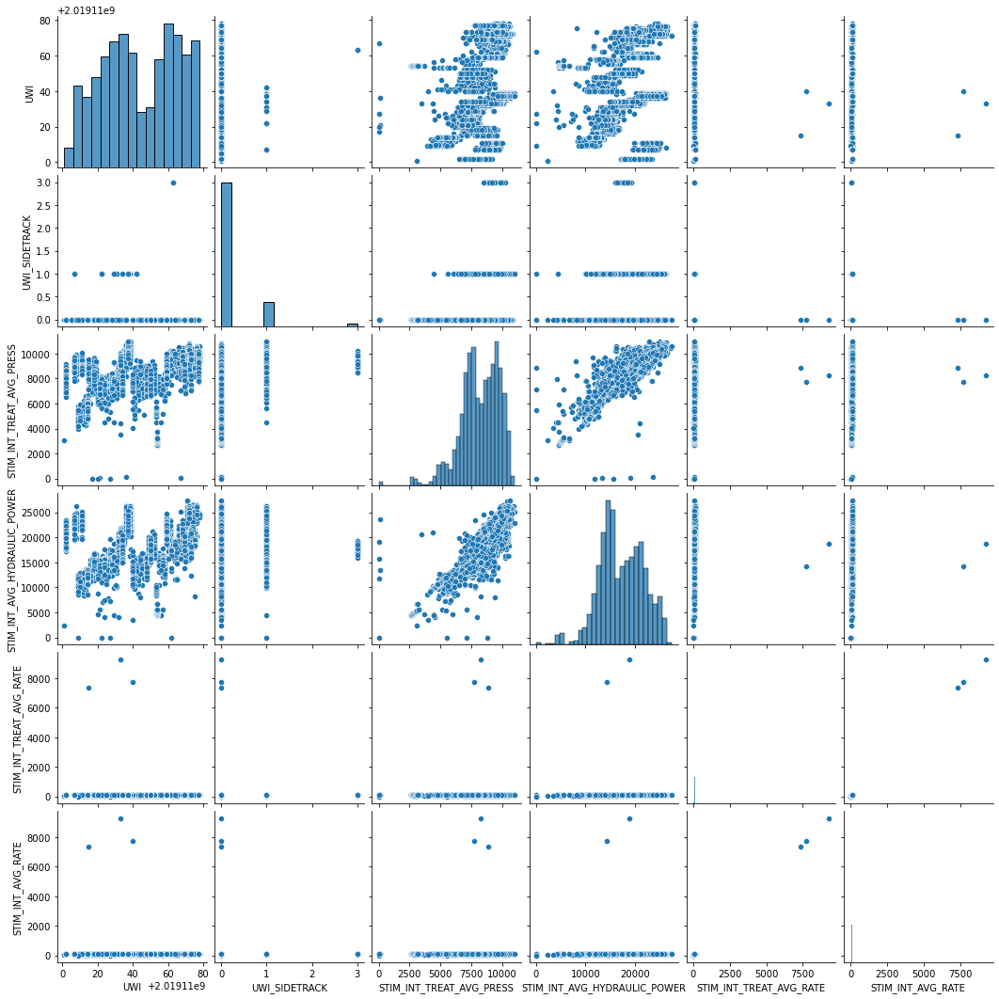

In [99]:
df1 = df5[avg_feature]
g = sns.pairplot(df1)

STIM_INT_AVG_HYDRALIC_POWER & STIM_INT_TREAT_AVG_PRESS have some correlation.
The hydralic power and press have a correlations in the max, min, avg etc.
Everything else is crappy

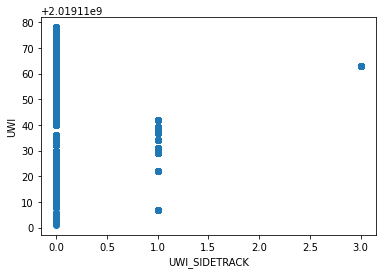

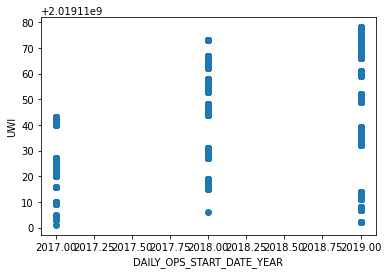

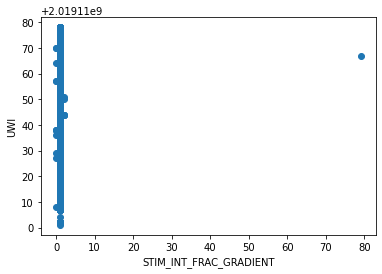

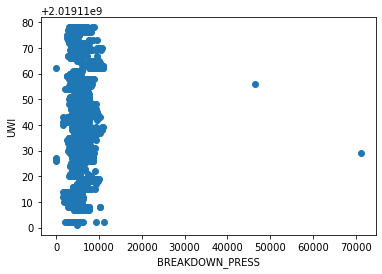

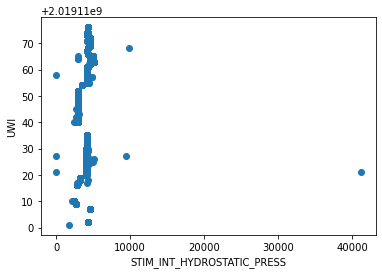

...

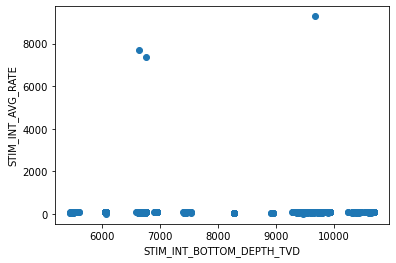

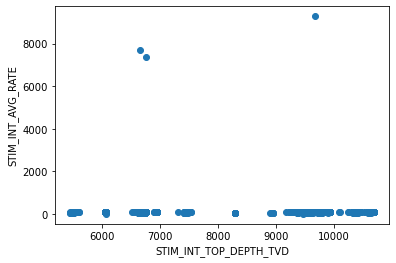

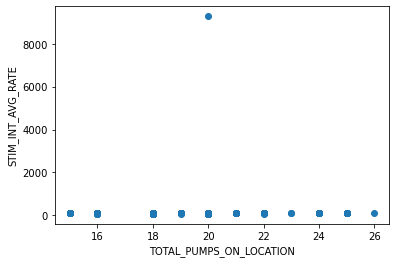

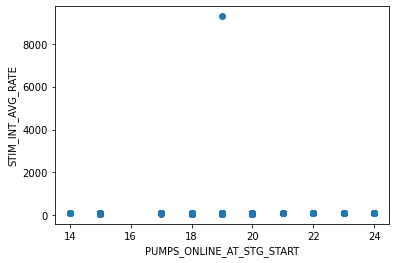

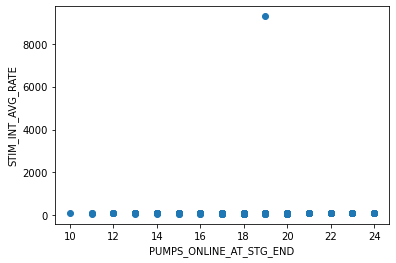

In [100]:
for feature in avg_feature:
    for var in numeric_features:
        data=df5.copy()
        if var != feature:
            plt.scatter(data[var],data[feature])
            plt.xlabel(var)
            plt.ylabel(feature)
            plt.show()

In [101]:
discrete_feature=[feature for feature in numeric_features if len(df5[feature].unique())>10 and feature not in avg_feature+['Id'] and len(df5[feature].unique())<1000 ]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 13


In [102]:
df5[discrete_feature].describe()


,STIM_INT_HYDROSTATIC_PRESS,STIM_INT_TREAT_MIN_PRESS,STIM_INT_PROPPANT_DESIGNED,STIM_INT_PROPPANT_TOTAL,STIM_INT_MAX_PUMP_RATING,STIM_INT_TREAT_MAX_RATE,STIM_INT_TREAT_MIN_RATE,STIM_INT_STAGE_NUMBER,ELEMENT_TOP_DEPTH,ELEMENT_BOTTOM_DEPTH,TOTAL_PUMPS_ON_LOCATION,PUMPS_ONLINE_AT_STG_START,PUMPS_ONLINE_AT_STG_END
count,2061.000000,1274.000000,2735.000000,2742.000000,2620.000000,2733.000000,2733.000000,2742.000000,1088.000000,1087.000000,1447.000000,1446.000000,1446.000000
mean,4032.087821,4440.056515,472651.136380,470936.458789,34050.316794,94.859129,14.332236,21.077681,13545.288603,13585.915363,20.431237,19.661826,18.827801
std,1025.598441,1169.125626,164456.661902,168090.302447,9980.556282,227.014483,80.339175,13.556568,4889.169884,5822.676824,1.823261,1.722964,1.999675
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,15.000000,14.000000,10.000000
25%,4062.000000,3863.250000,440000.000000,433520.000000,28000.000000,82.000000,7.000000,10.000000,10562.250000,10606.000000,20.000000,19.000000,18.000000
50%,4161.000000,4364.000000,550000.000000,550000.000000,36000.000000,90.000000,9.000000,19.000000,13279.500000,13298.000000,20.000000,20.000000,19.000000
75%,4252.000000,4942.000000,550250.000000,550600.000000,40000.000000,94.000000,11.000000,31.000000,16614.000000,16673.000000,22.000000,20.000000,20.000000
max,41089.000000,9240.000000,660260.000000,845040.000000,400000.000000,8527.000000,4133.000000,69.000000,107835.000000,150321.000000,26.000000,24.000000,24.000000


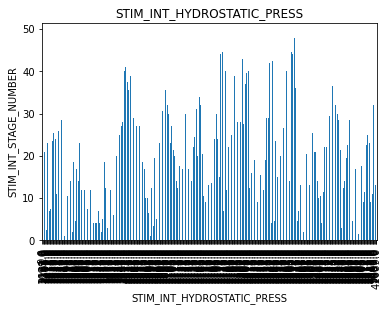

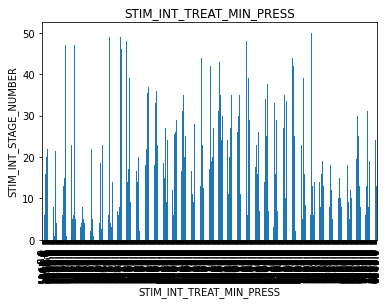

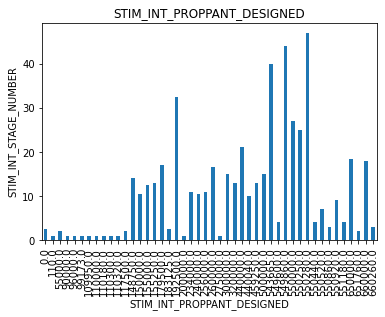

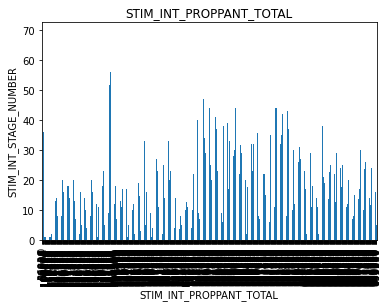

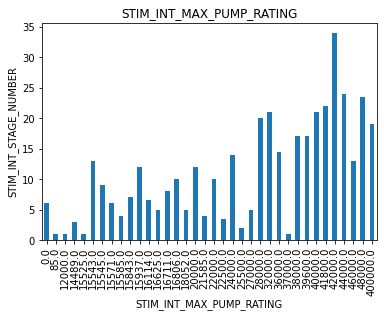

...

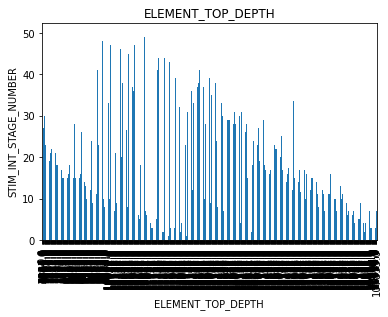

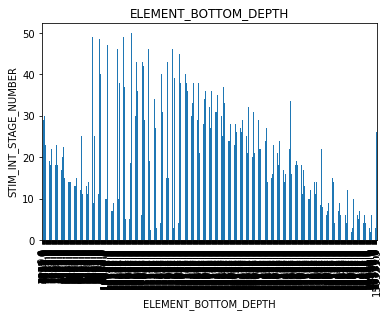

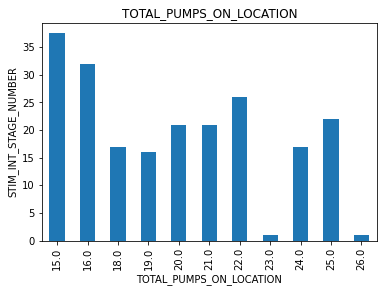

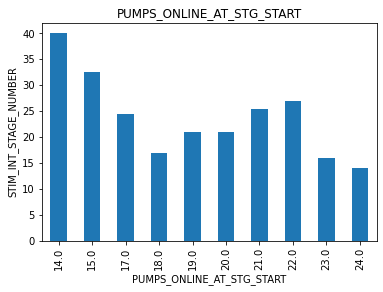

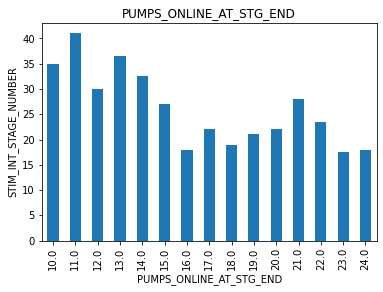

In [103]:
for feature in discrete_feature:
    if feature!='STIM_INT_STAGE_NUMBER':
        data=df5.copy()
        data.groupby(feature)['STIM_INT_STAGE_NUMBER'].median().plot.bar()
        plt.xlabel(feature)
        plt.ylabel('STIM_INT_STAGE_NUMBER')
        plt.title(feature)
        plt.show()


In [104]:
continuous_feature=[feature for feature in numeric_features if feature not in discrete_feature+avg_feature+['Id']]
print("Continuous Feature Count {}".format(len(continuous_feature)))

Continuous Feature Count 16


Some nice stuff in here

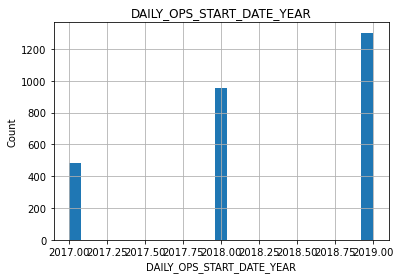

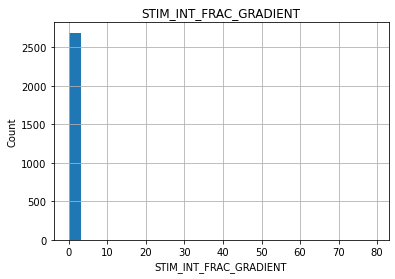

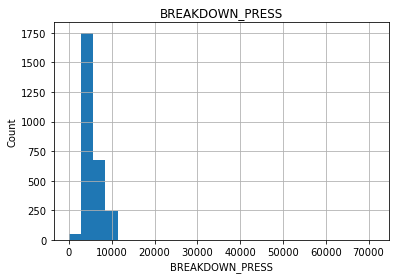

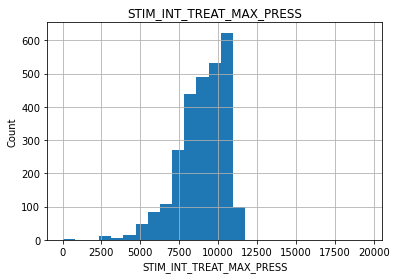

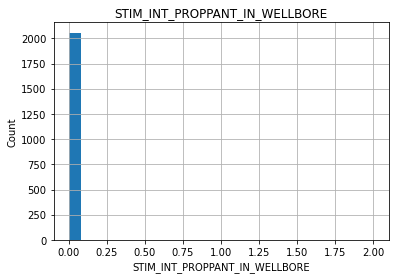

...

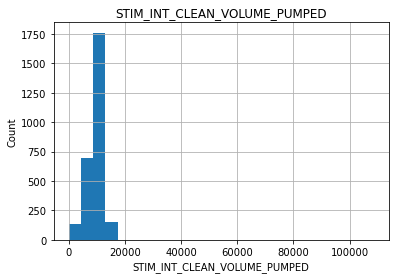

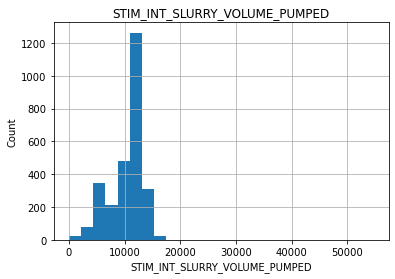

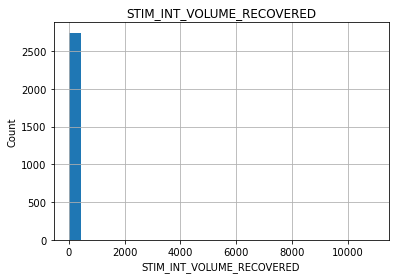

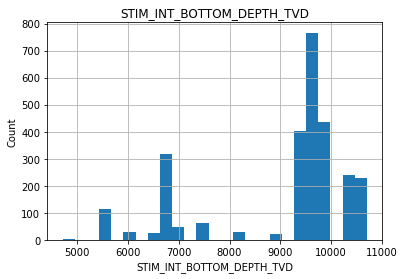

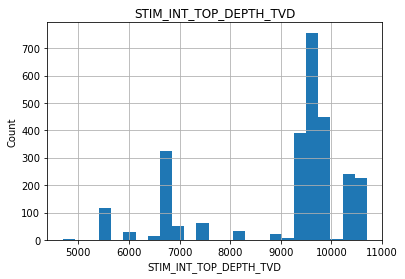

In [105]:
for feature in continuous_feature:
    data=df5.copy()
    data[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()